# Ряды Фурье <a class="tocSkip">

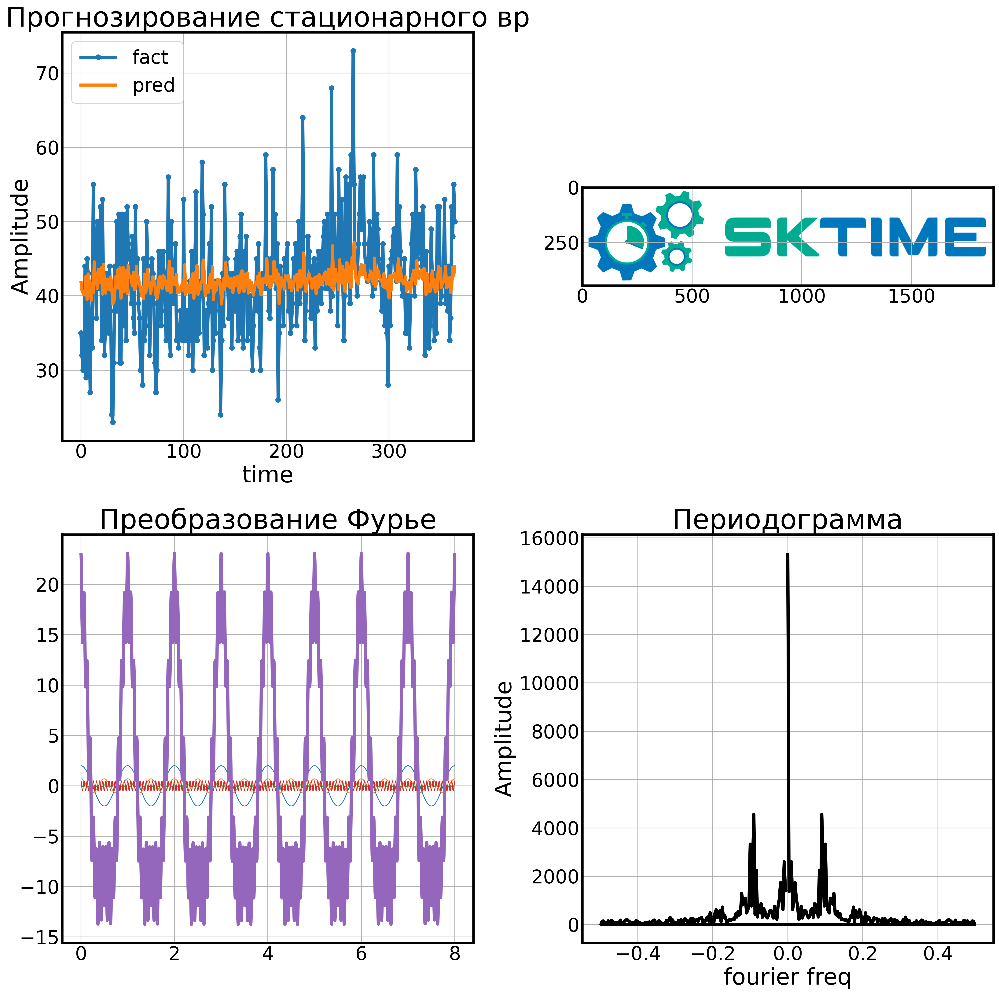

План текущего семинара:
1. Раскладываем вр в ряды Фурье, строим периодограммы, моделируем сезонность
2. Разбираем декомпозицию ряда и преобразование Бокса-Кокса 
3. Разбираем несколько примеров прогнозирования стационарных вр с помощью модели ARMA
4. Строим прогнозы вр с помощью stl-разложения

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns

import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings("ignore")
import statsmodels.api as sm
from scipy import stats
from statsmodels.graphics import tsaplots
from sktime.utils.plotting import plot_correlations
from itertools import product
from scipy import fft

In [6]:
import warnings
warnings.simplefilter("ignore")

In [7]:
params = {'lines.linewidth': 4,
          'lines.solid_capstyle': 'butt',
          'axes.labelsize': 'large',
          'axes.axisbelow': True,
          'axes.grid': True,
          'axes.linewidth': 3.0,
          'axes.titlesize': 'x-large',
          'grid.linestyle': '-',
          'grid.linewidth': 1.0,
          'xtick.major.size': 0,
          'xtick.minor.size': 0,
          'ytick.major.size': 0,
          'ytick.minor.size': 0,
          'figure.subplot.left': 0.08,
          'figure.subplot.right': 0.95,
          'figure.subplot.bottom': 0.07,
          'figure.figsize': (10.8, 7.8),
          'figure.autolayout': True,
          'figure.dpi': 300,
          'font.size': 24.0 }
plt.rcParams.update(params)

In [8]:
np.random.seed(555)

In [9]:
from sktime.performance_metrics.forecasting import MeanAbsoluteError,MeanAbsolutePercentageError
from sklearn.metrics import r2_score

def metrics_report(y_true,
                   y_pred
                  ):
    
    """
    Функция оценки качества прогноза. Оценивает персентили распределения ошибки 
    (медиану, среднее, 3й квартиль и 95-персентиль) 
    по абсолютной и относительной процентной ошибки для прогноза с помощью модели (y_pred) и
    для базового прогноза, равному среднему значению вр.
    
    """
    
    mape_func = MeanAbsolutePercentageError()
    mae_func = MeanAbsoluteError()
    
    y_true_mean = y_true.mean()*np.ones(shape=(len(y_true),))
    
    
    mapes = mape_func.evaluate_by_index(y_true,y_pred)*100
    maes = mae_func.evaluate_by_index(y_true,y_pred)
    
    
    mapes_zero = mape_func.evaluate_by_index(y_true,y_true_mean)*100
    maes_zero = mae_func.evaluate_by_index(y_true,y_true_mean)
    
    def quan_75(y,quan=0.75):
        return y.quantile(quan)

    def quan_95(y,quan=0.95):
        return y.quantile(quan)
    
    stats_list = ['mean','median',quan_75,quan_95,'std']
    
    res = pd.DataFrame([maes.agg(stats_list),
                        maes_zero.agg(stats_list),
                        mapes.agg(stats_list),
                        mapes_zero.agg(stats_list)],
                       index=['maes','maes_zero','mapes','mapes_zero'])
    
    res.loc["r2",:] = r2_score(y_true, y_pred)
    
    return res

In [10]:
from sktime.forecasting.arima import ARIMA
from sktime.forecasting.model_selection import ExpandingWindowSplitter
from sktime.forecasting.model_evaluation import evaluate
from sktime.forecasting.arima import AutoARIMA
from scipy.stats import ttest_1samp, shapiro
from statsmodels. tsa.stattools import adfuller, kpss
from statsmodels.graphics.gofplots import qqplot
from statsmodels.stats.diagnostic import acorr_ljungbox, het_breuschpagan

In [11]:
def calc_optimum_arma(ts,
                      max_p,
                       max_q): 
    """
    Подбор оптимальных гиперпараметров модели ARMA с помощью критерия Акаике.
    Идет перебор всех вариантов (p,q) в пределах (0,max_p)*(0,max_q)
    
    """
    
    best_bic = float("inf")
    
    ps = range(0, max_p+1)
    qs = range(0, max_q+1)
    parameters = product(ps, qs)
    parameters_list = list(parameters)
    
    print(len(parameters_list))
    
    results = []
    for param in parameters_list:
        #try except нужен, потому что на некоторых наборах параметров модель не обучается
        try:
            model=ARIMA(order=(param[0], 0, param[1])).fit(ts)
        #выводим параметры, на которых модель не обучается и переходим к следующему набору
        except ValueError:
            print('wrong parameters:', param)
            continue
        aic = model._forecaster.aic()
        bic = model._forecaster.bic()
        #сохраняем лучшую модель, aic, параметры
        if bic < best_bic:
            best_model = model
            best_bic = aic
            best_param = param
        results.append([param, aic, bic]) 
    
    return results, best_model
    

In [12]:
def check_fit(resids):
    
    """
    Проверка остатков на равенство нулю среднего, на стационарность, нормальность, отсутствие автокорреляций и 
    гомоскедастичность.
    """
    
    #mean = 0
    mean_t, mean_pval = ttest_1samp(resids,0)

    # stationary
    stat_t, stat_pval = adfuller(resids,maxlag=6)[:2]

    # normality 
    norm_t, norm_pval = shapiro(resids)
    
    # autocorr 
    autocor_pval = (acorr_ljungbox(resids,model_df=0,return_df=False)['lb_pvalue'] <0.05).sum()==0
    
    # heteroscedasticity  
    lm, lm_pval, ff, ff_pval = \
    het_breuschpagan(resids,sm.add_constant(resids.reset_index().index))

    records = {
        "mean_resids" : np.mean(resids),
        "mean_t" : mean_t,
        "mean_pval" : mean_pval,
        "stationary_t" : stat_t,
        "stationary_pval": 1 - stat_pval, # поменяли знак, чтобы желаемый результат всех проверок p_value>0.05 
        'autocor_pval': autocor_pval,
        "norm_t" : norm_t,
        "norm_pval" : norm_pval,
        "heteroscedasticity_t" : ff,
        "heteroscedasticity_pval" : ff_pval,
        "check_result" : (mean_pval>0.05) & (stat_pval<0.05) & (norm_pval>0.05) &\
        (ff_pval>0.05) & autocor_pval
       }
    
    return records

In [13]:
def plot_diagnostics(data, dt_col,resid_col):
    
    """
    Строим визуальную оценку остатков - остатки as-is, гистограмма остатков, qqplot и автокореляционную функцию.
    """
    
    fig,ax = plt.subplots(2,2,figsize=(15,10))

    # resid as-is
    sns.lineplot(data=data, x=dt_col, y=resid_col, ax=ax[0][0]);
    ax[0][0].axhline(0, c="k", linestyle="--")
    ax[0][0].set_title("Динамика ошибок прогноза")
    ax[0][0].set_xlabel(None)
    ax[0][0].set_ylabel(None)
    ax[0][0].xaxis.set_major_locator(plt.MaxNLocator(4))

    #hist
    sns.histplot(data=data,x=resid_col,ax=ax[0][1]);
    ax[0][1].set_title("Гистограмма ошибок прогноза")
    ax[0][1].set_xlabel(None)
    ax[0][1].set_ylabel(None)

    #acf
    sm.graphics.tsa.plot_acf(data[resid_col], lags=10,ax=ax[1][0]);
    ax[1][0].set_title("Автокореляции ошибок прогноза")
    ax[1][0].set_xlabel(None)
    ax[1][0].set_ylabel(None)

    #qq
    qqplot(data[resid_col],line='s',ax=ax[1][1]);
    ax[1][1].set_title("Q-q график ошибок прогноза")
    ax[1][1].set_xlabel(None)
    ax[1][1].set_ylabel(None)

In [14]:
np.random.seed(20)

# Ряды Фурье

В этом разделе мы разберемся, как моделировать вр с помощью рядов Фурье, как строить периодограммы для различных временных рядов и как моделировать длинную сезонность с помощью рядов Фурье.

## Построение периодограмм

Для начала посмотрим, как выглядят периодограммы известных вр. Пусть у нас будут подневные данные за 10 лет.

In [6]:
t_max = 10 # 10 лет
T = 365 # период колебаний - дней в году
N = t_max*T # всего наблюдений в генерируемом ВР
bandwidth = 1/N
t = np.linspace(0, t_max, N) 
freq_ny = 1/2 #Nyquist freq
tot_freq_cnt = N/2

белый шум

In [7]:
total = np.zeros(N)
total += np.random.normal(size=N) 

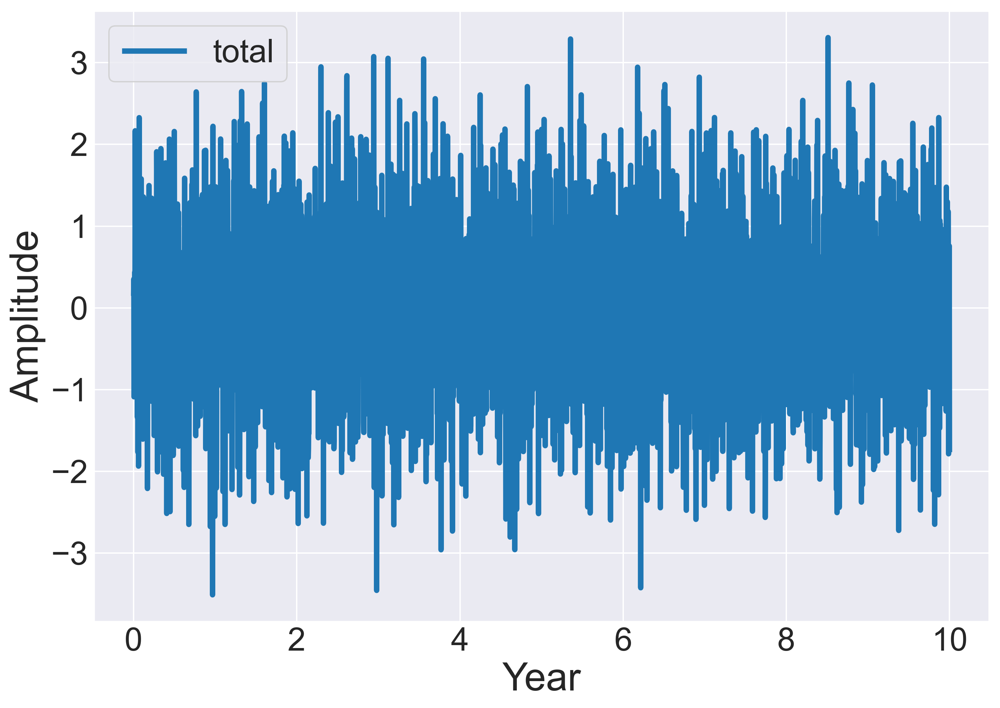

In [8]:
plt.plot(t, total, label='total')
plt.xlabel('Year')
plt.ylabel('Amplitude')
plt.legend()

Преобразование Фурье хорошо реализовано в библиотеке scipy

In [9]:
# прямое преобразование Фурье
fft_values = fft.fft(total)

In [10]:
fft_values

array([ -9.29525676 -0.j        , -42.24331749+37.38690836j,
        47.20396192+42.97642347j, ..., -15.8509662 -34.44338433j,
        47.20396192-42.97642347j, -42.24331749-37.38690836j])

In [81]:
print(fft_values.dtype,fft_values.shape)

complex128 (3650,)


In [82]:
fft_values

array([58.63670405 -0.j        , 17.26124609 +4.66256341j,
       12.79889333-15.71259592j, ..., 92.89014941+20.26786525j,
       12.79889333+15.71259592j, 17.26124609 -4.66256341j])

изобразим периодограмму без сглаживания

In [83]:
fft_real = np.abs(fft_values) #амплитуда гармоники 

In [85]:
# и соответствующие частоты
freq_values = fft.fftfreq(N, 1/365)

In [86]:
freq_new = fft.fftfreq(N)

In [26]:
len(freq_values)

3650

In [27]:
# согласно документации, частоты хранятся в таком порядке:
# сначало нулевая, затем c шагом 1/N от 1/N до T/2 и потом в обратном порядке со знаком минус
print(freq_values[:3],freq_values[N//2-2:N//2+2],freq_values[-3:])

[0.  0.1 0.2] [ 182.3  182.4 -182.5 -182.4] [-0.3 -0.2 -0.1]


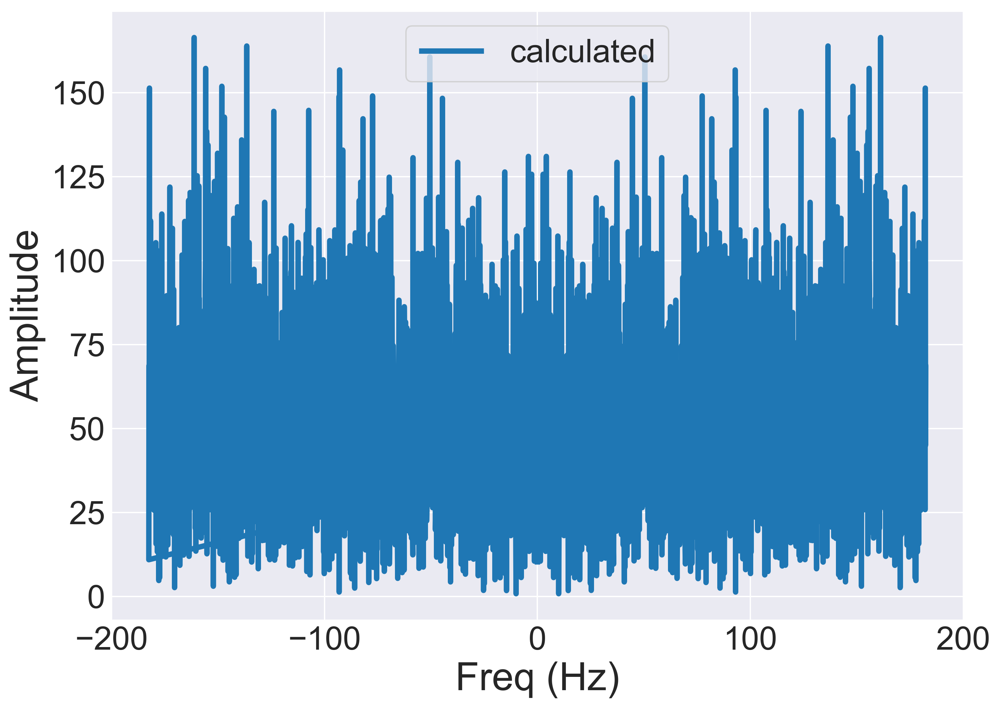

In [28]:
# график периодограммы - для белого шума выглядит также, как и исходный ряд
# Другими словами, такой вр содержит в одинаковом количестве все частоты, подобно тому, 
#как белый цвет содержит в себе все остальные цвета - откуда и название ряда - белый шум
plt.plot(freq_values, fft_real, label='calculated')
plt.xlabel('Freq (Hz)')
plt.ylabel('Amplitude')
plt.legend()

случайное блуждание

In [29]:
total = np.zeros(N)
total += np.cumsum(np.random.normal(size=N))

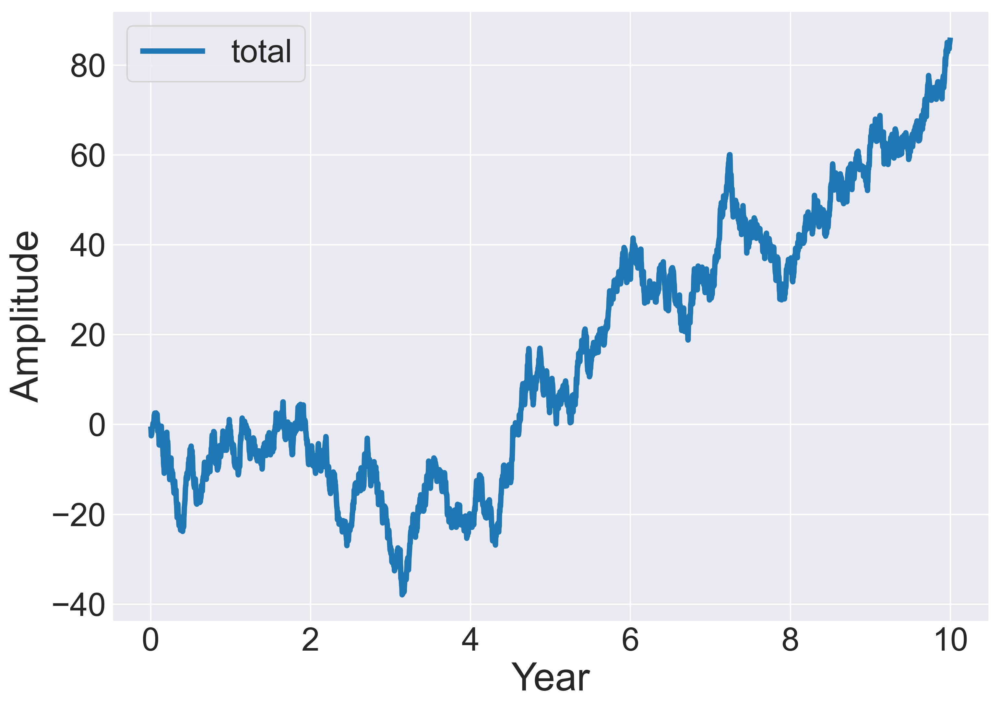

In [30]:
plt.plot(t, total, label='total')
plt.xlabel('Year')
plt.ylabel('Amplitude')
plt.legend()

In [31]:
fft_values = fft.fft(total)
fft_real = np.abs(fft_values) #амплитуда гармоники 

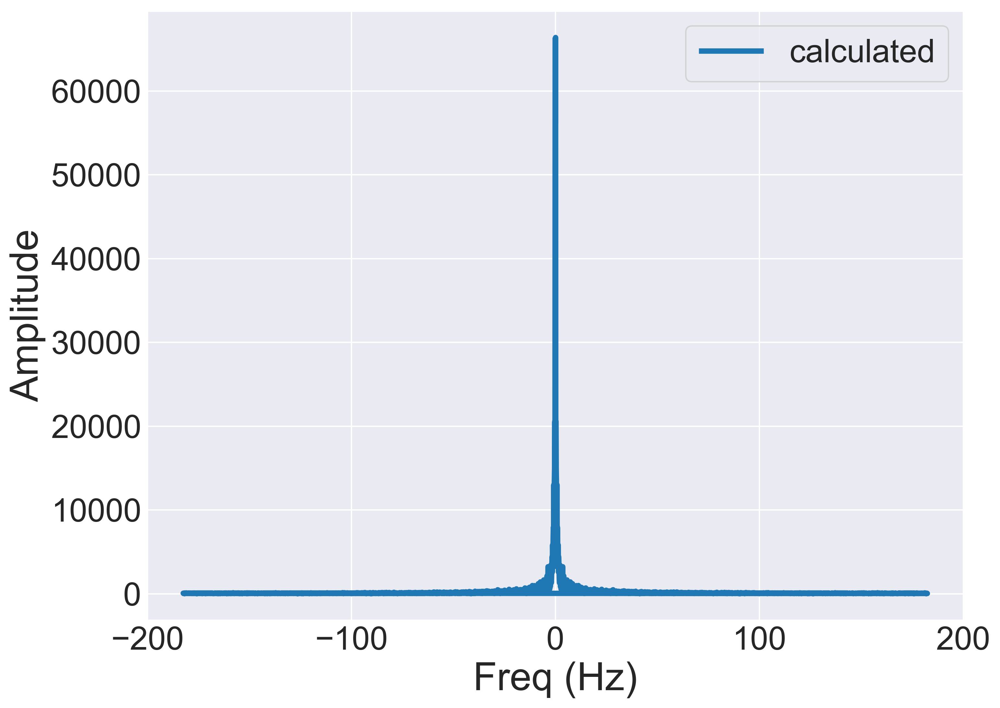

In [32]:
# периодограмма случайного блуждания - пик в 0, и потом быстрое убывание амплитуды с ростом частоты
plt.plot(freq_values, fft_real, label='calculated')
plt.xlabel('Freq (Hz)')
plt.ylabel('Amplitude')
plt.legend()

In [33]:
# амплитуды симметричных частот одинаковы
pd.DataFrame(zip(freq_values, fft_real))

,0,1
0,0.0,56101.999677
1,0.1,66381.450998
2,0.2,9963.248694
3,0.3,20553.329861
4,0.4,14987.556972
...,...,...
3645,-0.5,13491.787415
3646,-0.4,14987.556972
3647,-0.3,20553.329861
3648,-0.2,9963.248694


теперь попробуем смоделировать вр с несколькими детерминированными частотами и шумом

In [34]:
amp = np.array([2, .7, .1, 0.5]) # амплитуды частот
freq = np.array([1, 2, 10, 15]) # частоты - всего 4 частоты

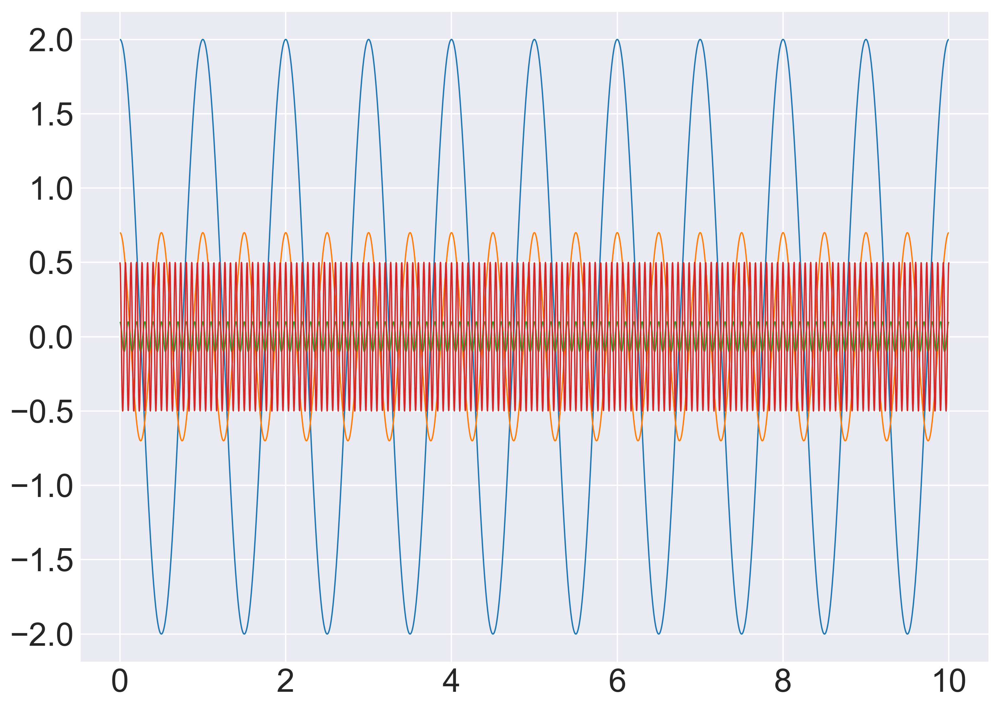

In [35]:
total = np.zeros(N)
components = []

n_freq = len(freq)

# добавляем детерминированные частоты
for i in range(n_freq):
    current = amp[i]*np.cos(2*np.pi*freq[i]*t)
    total += current
    
    components.append(current)
    plt.plot(t, current, label='f='+str(freq[i]), lw=1)

total += np.random.normal(size=N,scale=3) # добавляем шум

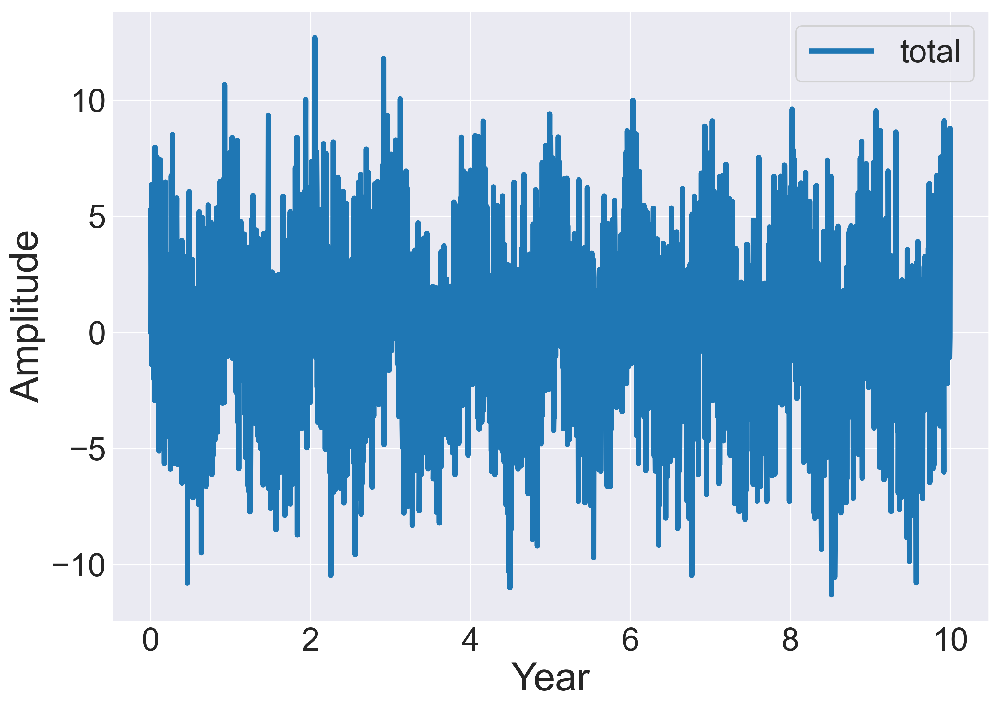

In [36]:
plt.plot(t, total, label='total')
plt.xlabel('Year')
plt.ylabel('Amplitude')
plt.legend()

(0.0, 2.0)

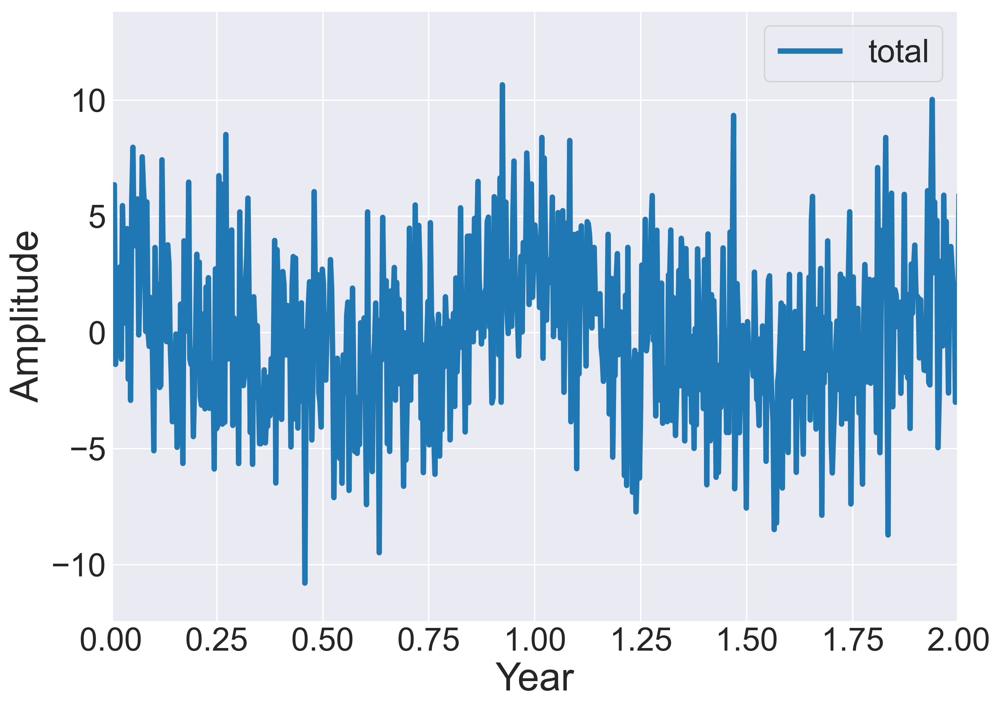

In [37]:
# визуально видно только самую медленную частоту
plt.plot(t, total, label='total')
plt.xlabel('Year')
plt.ylabel('Amplitude')
plt.legend()
plt.xlim(0,2)

In [38]:
fft_values = fft.fft(total)

In [39]:
# нормировка амплитуд для обратного преобразования фурье
fft_real = 2.0/N * np.abs(fft_values)

In [40]:
# большую амплитуду имеет только 6 наблюдений
np.where(fft_real>0.3)

(array([  10,   20,  150, 3500, 3630, 3640], dtype=int64),)

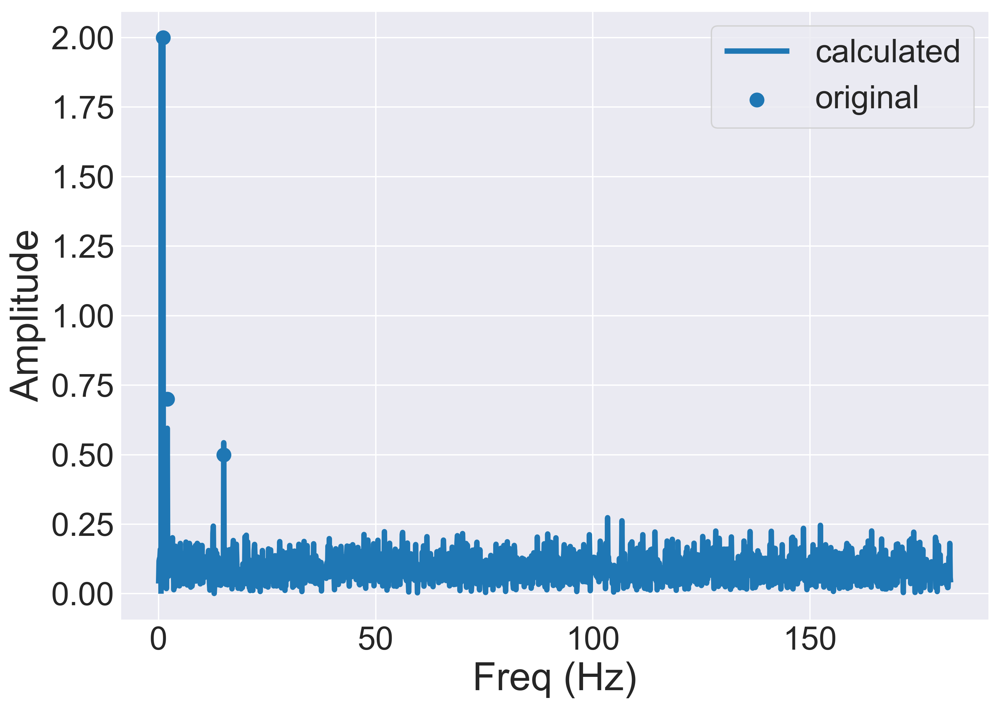

In [41]:
plt.plot(freq_values[0:N//2], fft_real[0:N//2], label='calculated')
plt.scatter(freq, amp, s=100, zorder=3, label='original')
plt.vlines(x=freq_ny,ymin=0,ymax=2)
plt.xlabel('Freq (Hz)')
plt.ylabel('Amplitude')
plt.legend()
#plt.xlim(0,20)

Видим, что несмотря на шум, ряд фурье успешно детектировал 3 из 4 частот в исходном вр. Одну не получилось - амплитуда была слишком маленькой, и она утонула в белом шуме.

In [15]:
import pandas as pd


In [16]:
Sun = pd.read_csv("sun.csv")
Sun['YEAR'] = pd.to_datetime(Sun['YEAR'].astype(int).astype(str) + '-01-01')
Sun.set_index("YEAR",inplace=True)

In [ ]:
Sun.plot()

In [19]:
type(Sun)

pandas.core.frame.DataFrame

In [45]:
N = len(Sun)
fft_values = fft.fft(Sun.values,axis=0)

In [46]:
freq_values = fft.fftfreq(N,)

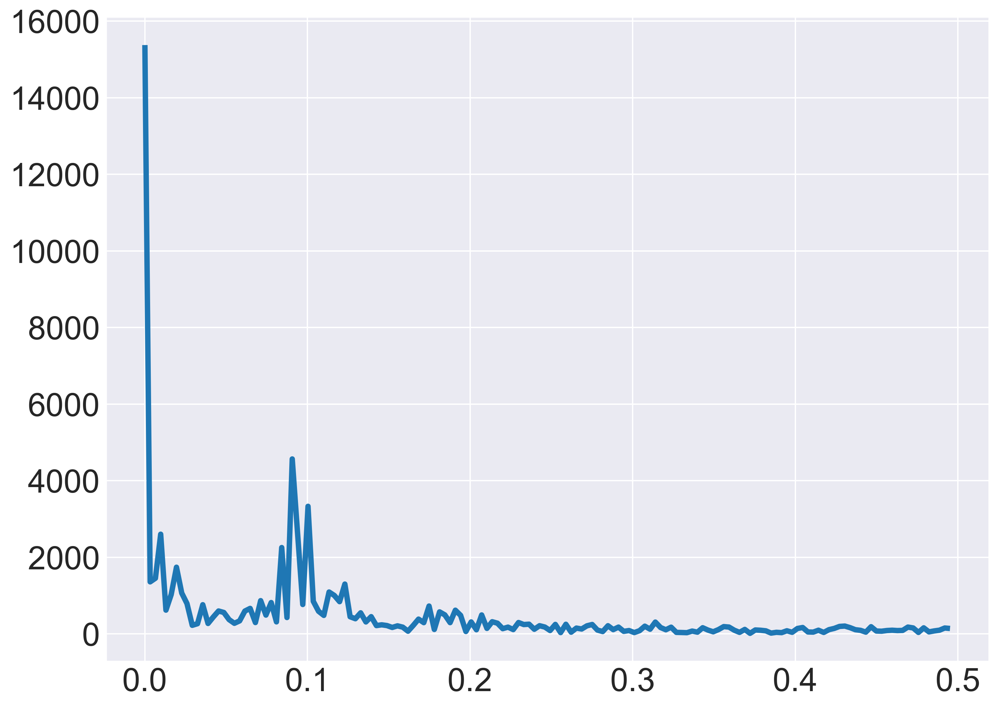

In [47]:
# периодограмма ряда солнечной активности
# основной вклад вност частоты около 0.1
fig, ax = plt.subplots(1)
ax.plot(freq_values[:N//2], np.abs(fft_values[:N//2]));

In [7]:
airline = pd.read_csv('international-airline-passengers.csv', sep=';')
airline['Month'] = pd.to_datetime(airline['Month']+'-01')
airline.set_index('Month', inplace=True)

<Axes: xlabel='Month'>

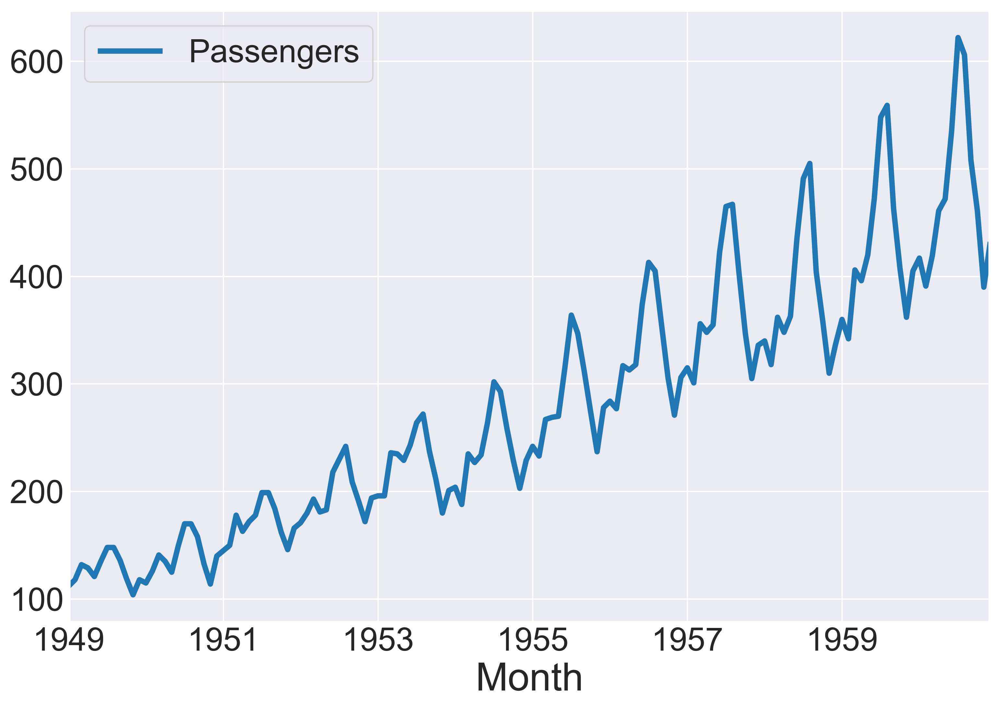

In [8]:
airline.plot()

In [13]:
# прямое преобразование фурье
fft_values = fft.fft(airline,axis=0)
N = len(airline)
freq_values = fft.fftfreq(N, 1/24) # все частоты по оси х отображаются относительно частоты "1 раз за год"

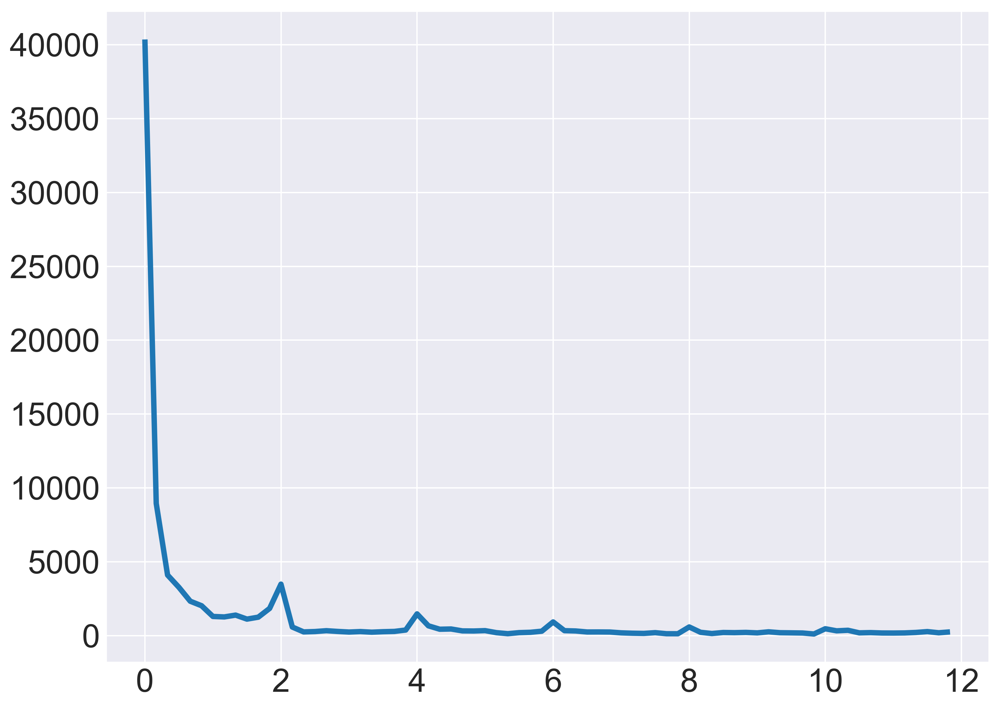

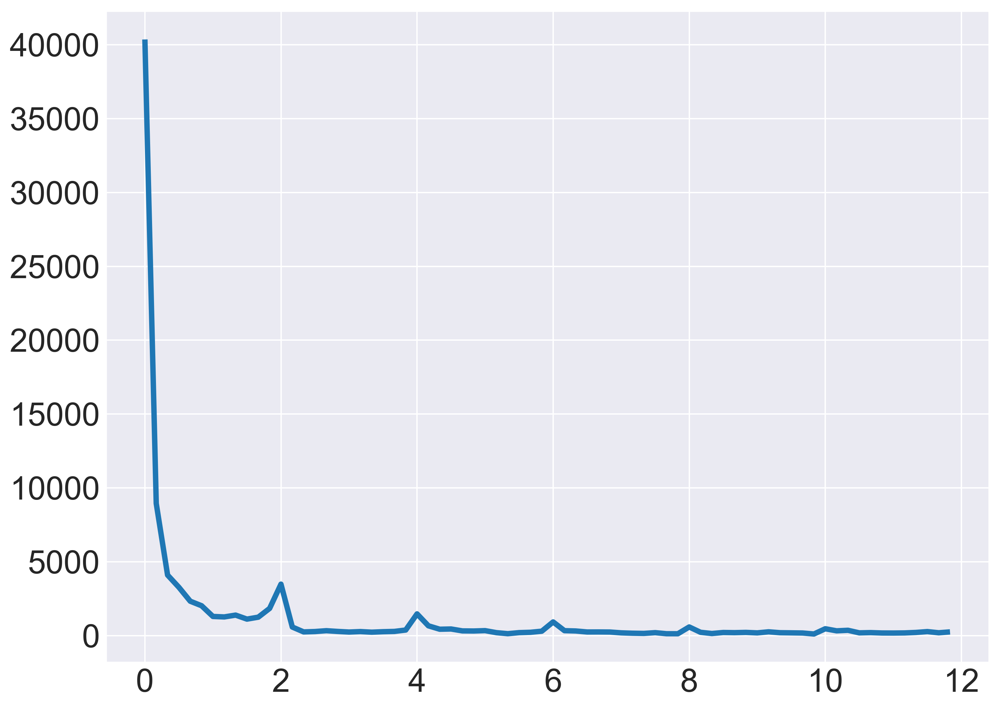

In [15]:
 #периодограмма ряда авиаперевозок - видим пик около 0 и в частотах, кратных частоте "1 раз за год"
fig, ax = plt.subplots(1)
ax.plot(freq_values[:N//2], np.abs(fft_values[:N//2]));# периодограмма ряда авиаперевозок - видим пик около 0 и в частотах, кратных частоте "1 раз за год"
fig, ax = plt.subplots(1)
ax.plot(freq_values[:N//2], np.abs(fft_values[:N//2]));

## Аппроксимация вр

<Axes: xlabel='YEAR'>

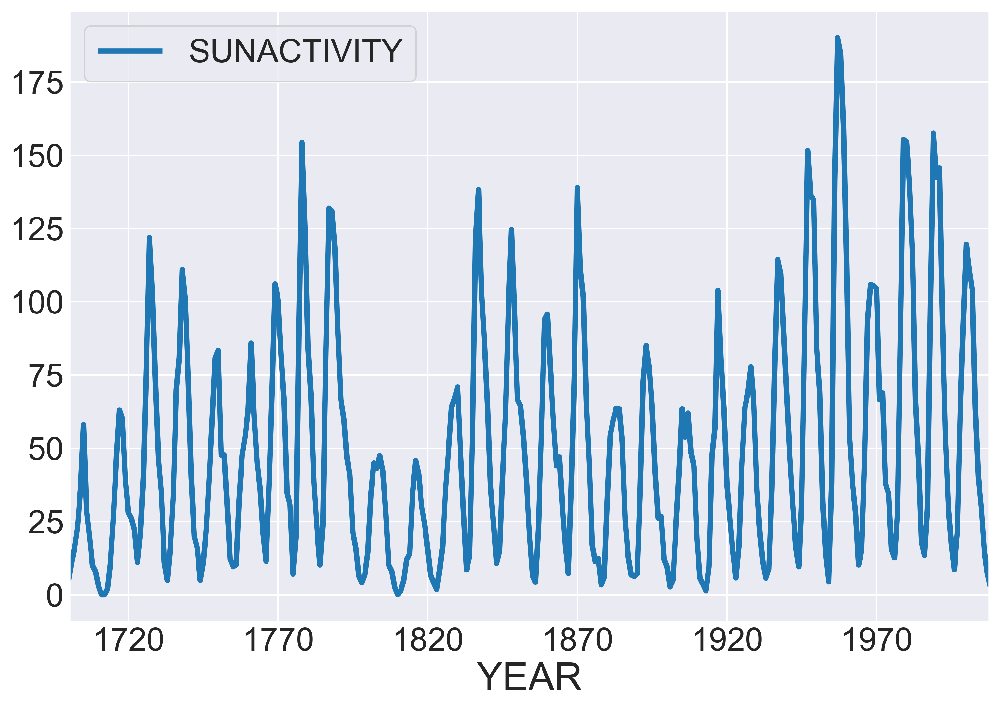

In [53]:
Sun.plot()

In [54]:
# преобразование фурье, частота, амплитуда и фаза комплексных чисел
x_freqdom = fft.fft(Sun.values,axis=0)
N=len(Sun.values)
fourier = pd.DataFrame(x_freqdom)
fourier['freq'] = fft.fftfreq(N,1) 
fourier['amp'] = np.absolute(x_freqdom) / N
fourier['phase'] = np.angle(x_freqdom)

In [55]:
fourier.sort_values(by='amp',ascending=False)

,0,freq,amp,phase
0,15373.400000- 0.000000j,0.000000,49.752104,-0.000000
281,-4391.782265+ 1253.691784j,-0.090615,14.780646,2.863525
28,-4391.782265- 1253.691784j,0.090615,14.780646,-2.863525
278,3046.408257- 1347.458363j,-0.100324,10.780269,-0.416441
31,3046.408257+ 1347.458363j,0.100324,10.780269,0.416441
...,...,...,...,...
190,5.129721- 19.931291j,-0.385113,0.066605,-1.318893
115,-4.786208+ 13.479298j,0.372168,0.046291,1.911988
194,-4.786208- 13.479298j,-0.372168,0.046291,-1.911988
155,7.968927- 5.761469j,-0.498382,0.031824,-0.625991


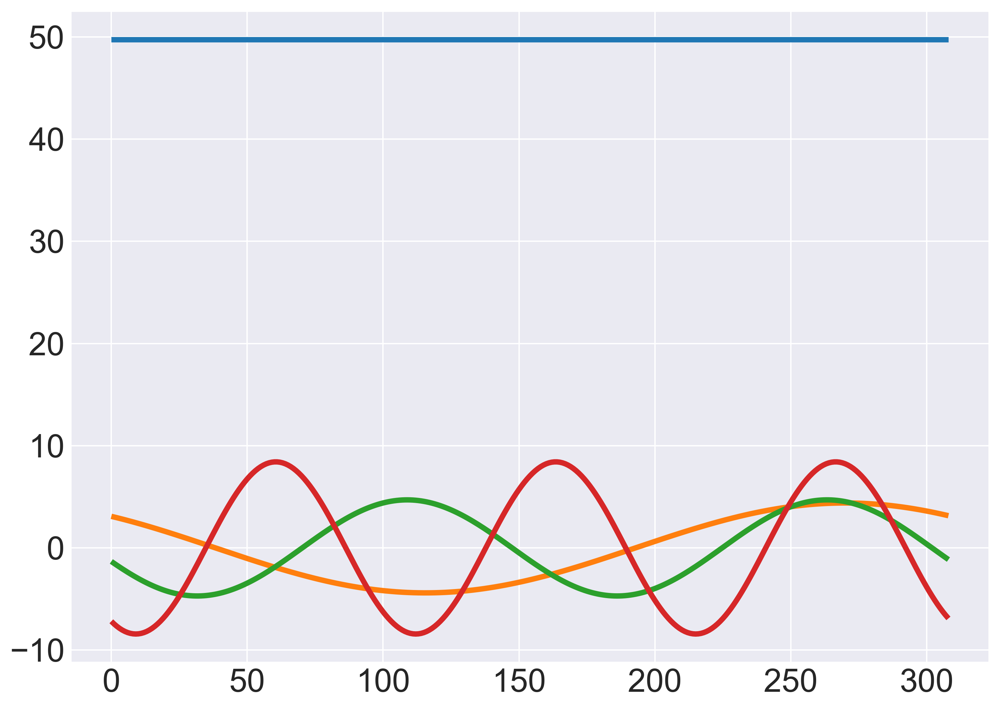

In [56]:
# график первых компонент Фурье
t = np.arange(0, len(Sun))
for i in range(4):
    plt.plot(t, fourier.iloc[i,2] * np.cos(2 * np.pi * fourier.iloc[i,1] * t  + fourier.iloc[i,3]))

In [57]:
N = len(Sun)
fft_values = fft.fft(Sun.values,axis=0)

In [58]:
freq_values = fft.fftfreq(N,)

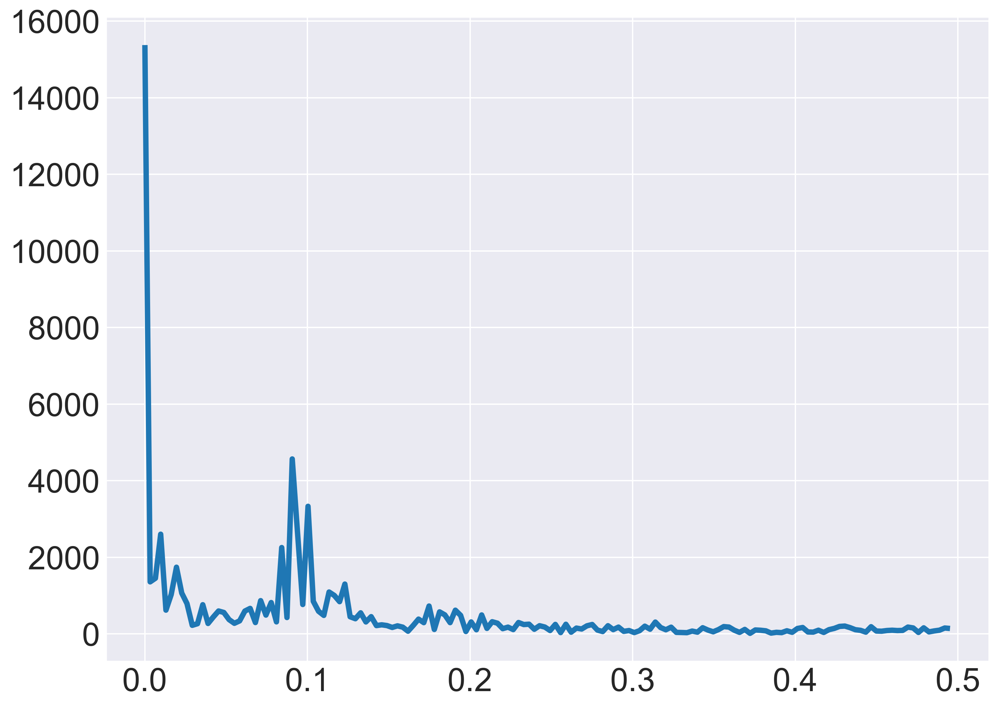

In [59]:
# периодограмма ряда солнечной активности
# основной вклад вност частоты около 0.1
fig, ax = plt.subplots(1)
ax.plot(freq_values[:N//2], np.abs(fft_values[:N//2]));

In [60]:
fourier.sort_values(by='amp',ascending=False,inplace=True)

In [61]:
fourier

,0,freq,amp,phase
0,15373.400000- 0.000000j,0.000000,49.752104,-0.000000
281,-4391.782265+ 1253.691784j,-0.090615,14.780646,2.863525
28,-4391.782265- 1253.691784j,0.090615,14.780646,-2.863525
278,3046.408257- 1347.458363j,-0.100324,10.780269,-0.416441
31,3046.408257+ 1347.458363j,0.100324,10.780269,0.416441
...,...,...,...,...
190,5.129721- 19.931291j,-0.385113,0.066605,-1.318893
115,-4.786208+ 13.479298j,0.372168,0.046291,1.911988
194,-4.786208- 13.479298j,-0.372168,0.046291,-1.911988
155,7.968927- 5.761469j,-0.498382,0.031824,-0.625991


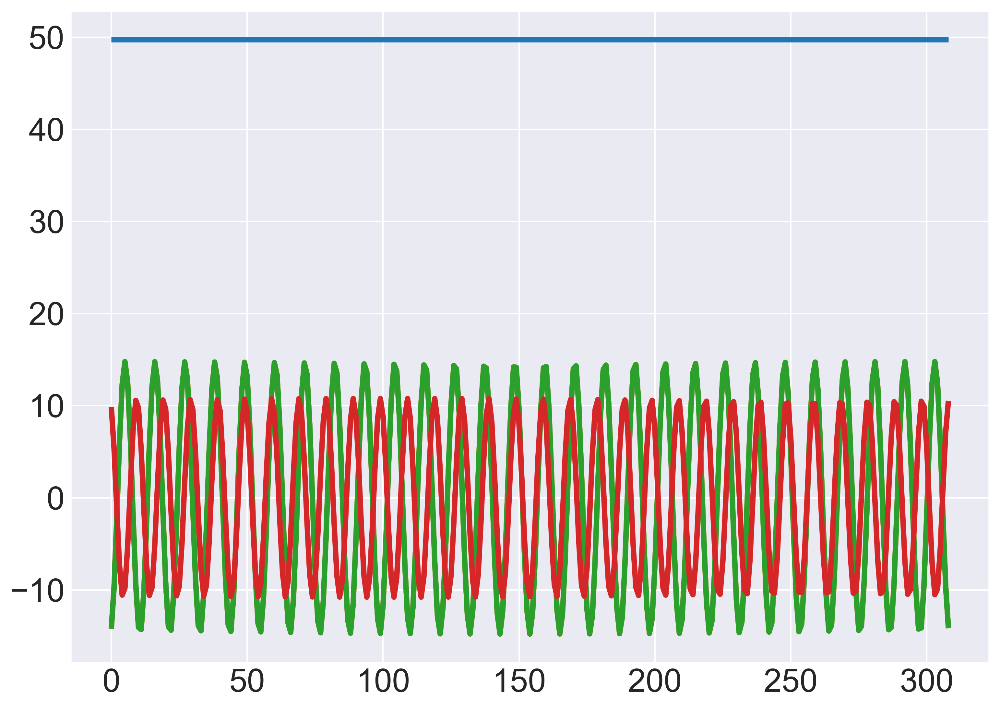

In [62]:
# график первых компонент Фурье по амплитуде
t = np.arange(0, len(Sun))
for i in range(4):
    plt.plot(t, fourier.iloc[i,2] * np.cos(2 * np.pi * fourier.iloc[i,1] * t  + fourier.iloc[i,3]))

In [63]:
# фильтр низких частот (Здесь всё верно, фильтр низних частот оставялет низкие частоты)
filtered = fft_values.copy()
filtered[(np.abs(freq_values) > 0.15)] = 0

In [64]:
# обратное преобразование Фурье
signal_filtered = np.real(fft.ifft(filtered, axis=0))

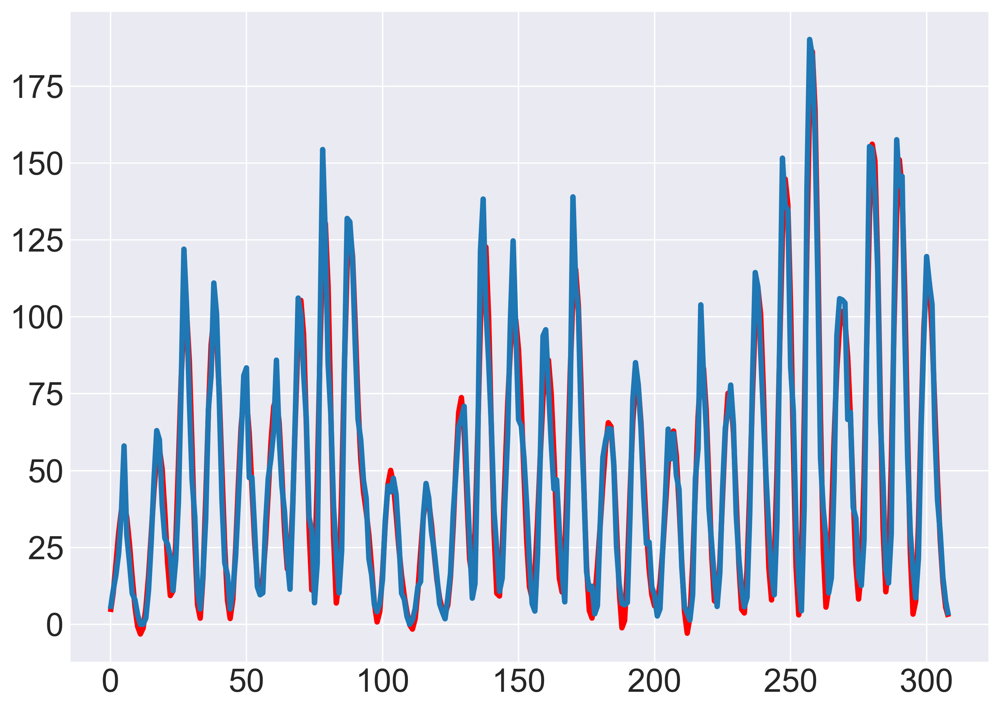

In [65]:
# мы очистили 70% всех частот, при этом вр практически не изменился
plt.plot(signal_filtered,c='red')
plt.plot(Sun.values)

In [66]:
# полосовой фильтр
filtered = fft_values.copy()
filtered[~((np.abs(freq_values) < 0.12) & (np.abs(freq_values) > 0.09))] = 0

In [67]:
# обратное преобразование Фурье
signal_filtered = np.real(fft.ifft(filtered, axis=0))

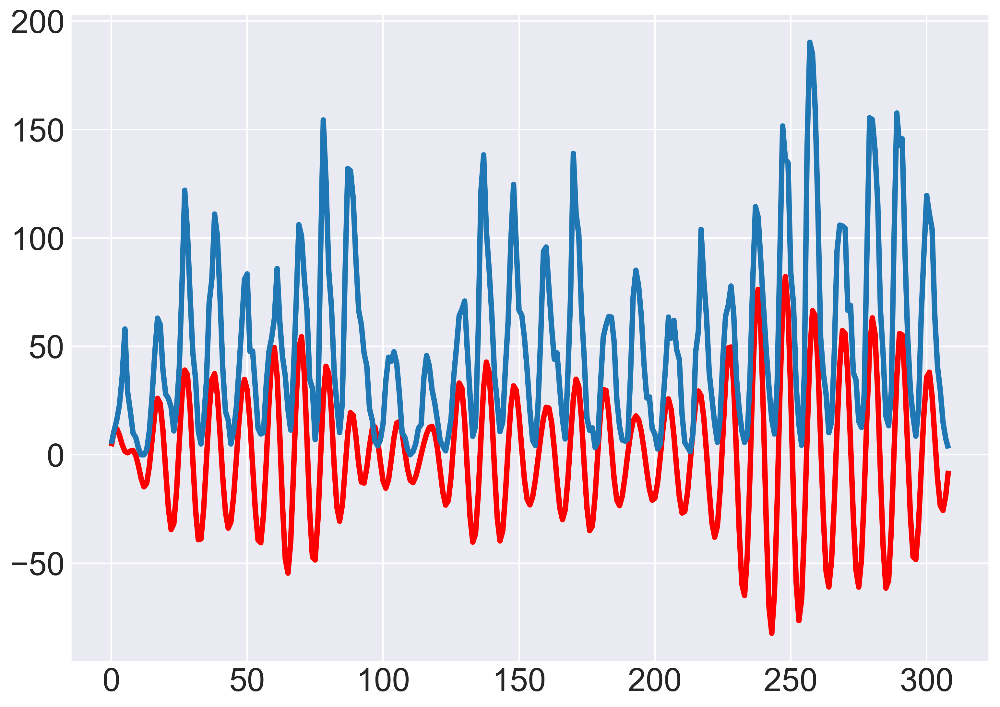

In [68]:
plt.plot(signal_filtered,c='red')
plt.plot(Sun.values)

посмотрим, как работает экстраполяция с помощью рядов Фурье в сравнении с моделью ARIMA. Посмотрим на короткий и длительный промежутки времени

In [70]:
from sktime.forecasting.arima import ARIMA

In [71]:
forecaster_short = ARIMA((3,0,3))
forecaster_long = ARIMA((3,0,3))

In [72]:
forecaster_long.fit(Sun.values[:-100])
forecaster_short.fit(Sun.values[:-10])

ARIMA(order=(3, 0, 3))

In [92]:
def fourierExtrapolation(x, n_predict, n_harm = 20, inner_freq = 1.0):
    """
    Функция для экстраполяции рядов Фурье. По вр х делает предикт на n_predict шагов
    с помощью меньших частот
    Возвращает исходный ряд + экстраполяцию на n_predict шагов
    
    https://gist.github.com/tartakynov/83f3cd8f44208a1856ce
    """
    n = x.size
    t = np.arange(0, n)

    x_freqdom = fft.fft(x,axis=0)  # x in frequency domain
    f = fft.fftfreq(n,inner_freq)              # frequencies
    indexes = list(range(n))
    # sort indexes by frequency, lower -> higher
    indexes.sort(key=lambda i: np.absolute(f[i]))
    
    t = np.arange(0, n + n_predict)
    restored_sig = np.zeros(t.size)
    for i in indexes[:1 + n_harm * 2]:
        ampli = np.absolute(x_freqdom[i]) / n   # amplitude
        phase = np.angle(x_freqdom[i])          # phase
        restored_sig += ampli * np.cos(2 * np.pi * f[i] * t * inner_freq  + phase)
    return restored_sig

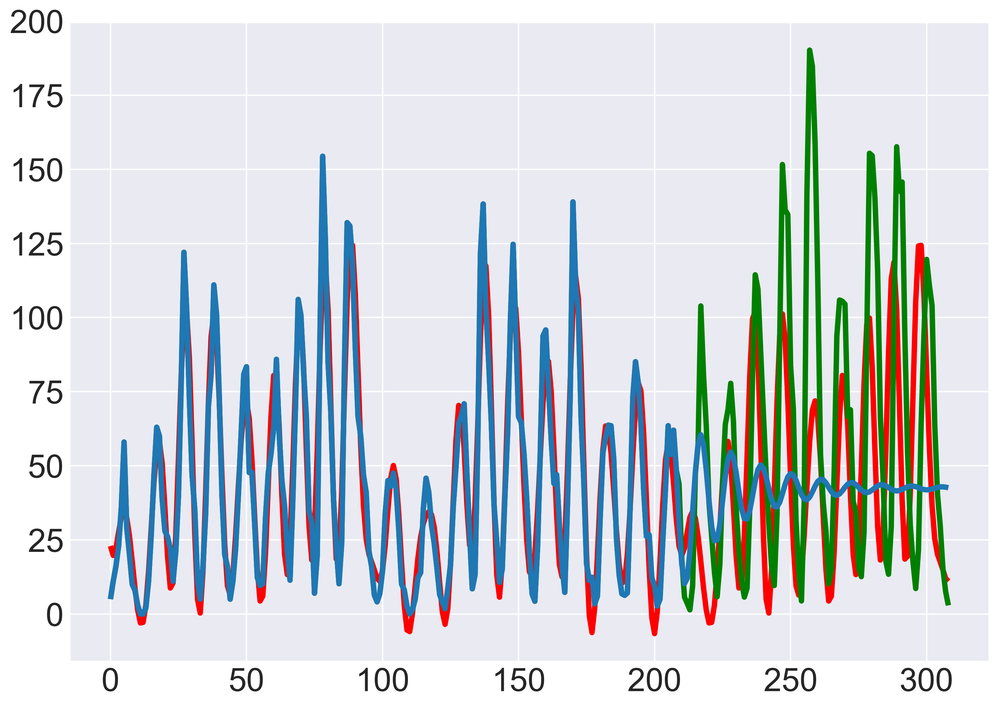

In [93]:
# графическое сравнение прогнозов на длинном промежутке
plt.plot(fourierExtrapolation(Sun.values[:-100,:],100,25,1),c='red')
plt.plot(Sun.values,c='green')
plt.plot(np.r_[Sun.values[:-100,:],forecaster_long.predict(fh=list(range(1,101)))])

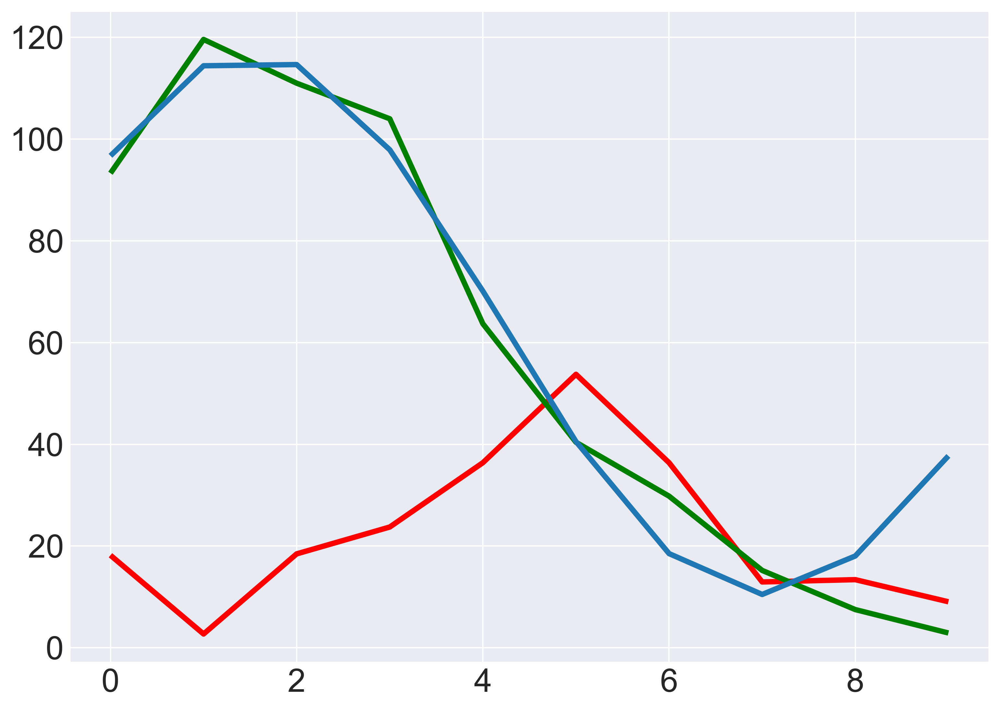

In [75]:
# графическое сравнение прогнозов на коротком промежутке
plt.plot(fourierExtrapolation(Sun.values[:-10,:],10,100,1)[-10:],c='red')
plt.plot(Sun.iloc[-10:].values,c='green')
plt.plot(forecaster_short.predict(fh=list(range(1,11))))

сравнение метрик на длинном промежутке - ряды фурье чуть более адекватно описывают вр, хотя далеко от идеального, т.к. у исходного вр непостоянный период колебаний

In [76]:
metrics_report(Sun.values[-100:], 
               fourierExtrapolation(Sun.values[:-100,:],100,25,1)[-100:])

,mean,median,quan_75,quan_95,std
maes,36.242991,28.933119,50.291084,96.977932,29.638263
maes_zero,40.765760,41.350000,52.961000,92.268000,26.244892
mapes,127.256173,55.934436,90.448479,478.778469,265.936246
mapes_zero,238.521466,59.256703,238.611732,994.245614,538.043125
r2,0.068504,0.068504,0.068504,0.068504,0.068504


In [94]:
metrics_report(Sun.values[-100:], 
               forecaster_long.predict(fh=list(range(1,101))))

,mean,median,quan_75,quan_95,std
maes,37.199477,24.477040,54.072568,112.851187,35.104621
maes_zero,40.765760,41.350000,52.961000,92.268000,26.244892
mapes,119.043024,58.792778,80.061670,402.728438,219.081254
mapes_zero,238.521466,59.256703,238.611732,994.245614,538.043125
r2,-0.110958,-0.110958,-0.110958,-0.110958,-0.110958


In [95]:
# при увеличении кол-ва гармоник качество прогноза не улучшается 
# кол-во гармоник - гиперпараметр, который нужно подбирать
metrics_report(Sun.values[-100:], 
               fourierExtrapolation(Sun.values[:-100,:],100,50,1)[-100:])

,mean,median,quan_75,quan_95,std
maes,36.514046,32.366220,51.145228,104.091597,31.133749
maes_zero,40.765760,41.350000,52.961000,92.268000,26.244892
mapes,128.575757,56.163167,90.721978,388.805905,331.189788
mapes_zero,238.521466,59.256703,238.611732,994.245614,538.043125
r2,0.021701,0.021701,0.021701,0.021701,0.021701


сравнение метрик на коротком промежутке - здесь модель arma прогнозирует очень хорошо в отличии от рядов Фурье

In [97]:
metrics_report(Sun.values[-10:], 
               fourierExtrapolation(Sun.values[:-10,:],10,25,1)[-10:])

,mean,median,quan_75,quan_95,std
maes,43.132997,21.774339,81.718970,99.965076,41.570793
maes_zero,39.580000,44.400000,52.005000,58.601000,17.795130
mapes,91.924409,79.371890,89.065843,223.012412,77.711437
mapes_zero,322.398964,48.983684,239.114050,1366.474483,599.689243
r2,-0.844792,-0.844792,-0.844792,-0.844792,-0.844792


In [98]:
metrics_report(Sun.values[-10:], 
               forecaster_short.predict(fh=list(range(1,11))))

,mean,median,quan_75,quan_95,std
maes,8.627584,5.634845,9.506463,24.227065,9.766935
maes_zero,39.580000,44.400000,52.005000,58.601000,17.795130
mapes,143.739897,7.968598,36.196113,723.409205,373.653248
mapes_zero,322.398964,48.983684,239.114050,1366.474483,599.689243
r2,0.913431,0.913431,0.913431,0.913431,0.913431


In [100]:
airline = pd.read_csv('international-airline-passengers.csv', sep=';')
airline['Month'] = pd.to_datetime(airline['Month']+'-01')
airline.set_index('Month', inplace=True)

<Axes: xlabel='Month'>

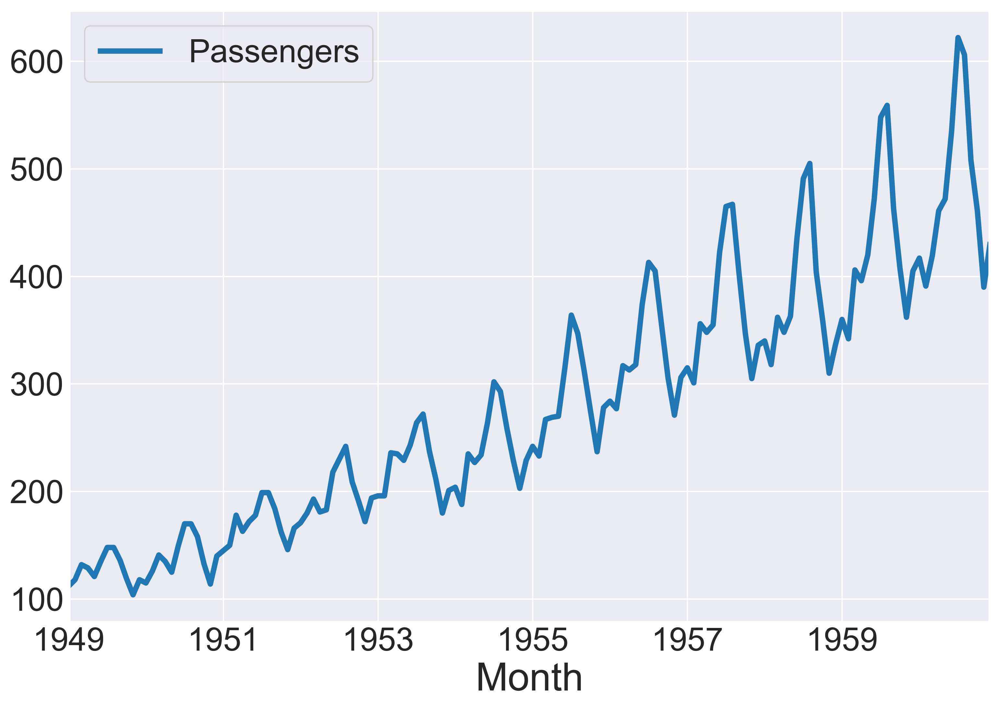

In [101]:
airline.plot()

In [102]:
# прямое преобразование фурье
fft_values = fft.fft(airline,axis=0)
N = len(airline)
freq_values = fft.fftfreq(N, 1/12) # все частоты по оси х отображаются относительно частоты "1 раз за год"

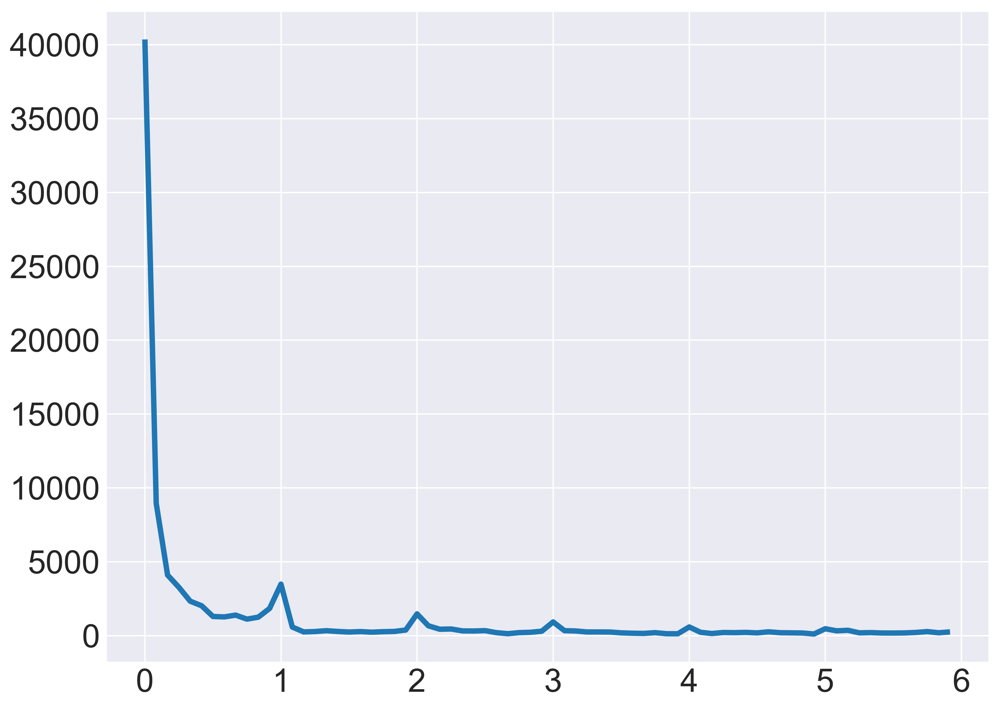

In [103]:
# периодограмма ряда авиаперевозок - видим пик около 0 и в частотах, кратных частоте "1 раз за год"
fig, ax = plt.subplots(1)
ax.plot(freq_values[:N//2], np.abs(fft_values[:N//2]));

In [109]:
# Низкочастотный фильтр, потому что оставляет  маленькие частоты - гармоника колеблется дольше. Большие частоты больше будут замушлять, чем давать вклад в прогноз
filtered = fft_values.copy()
filtered[(np.abs(freq_values) > 3.3)] = 0
signal_filtered = np.real(fft.ifft(filtered, axis=0))

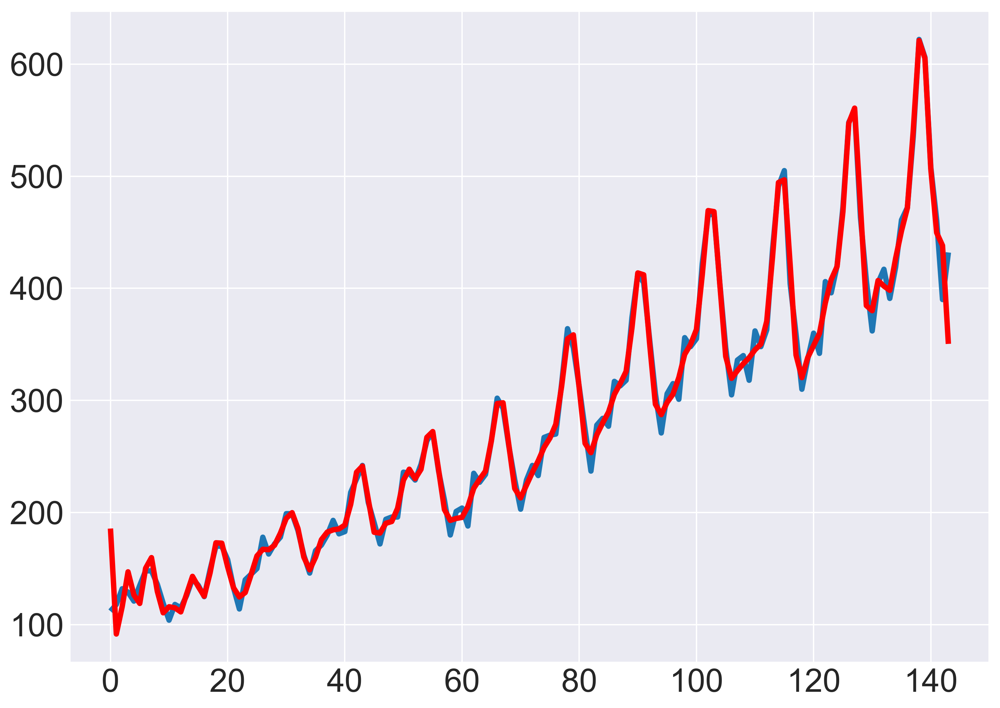

In [110]:
#у восстановленного ряда наблюдаются сильные отклонения на краях отрезка (0,T)
plt.plot(airline.values)
plt.plot(signal_filtered,c='red')

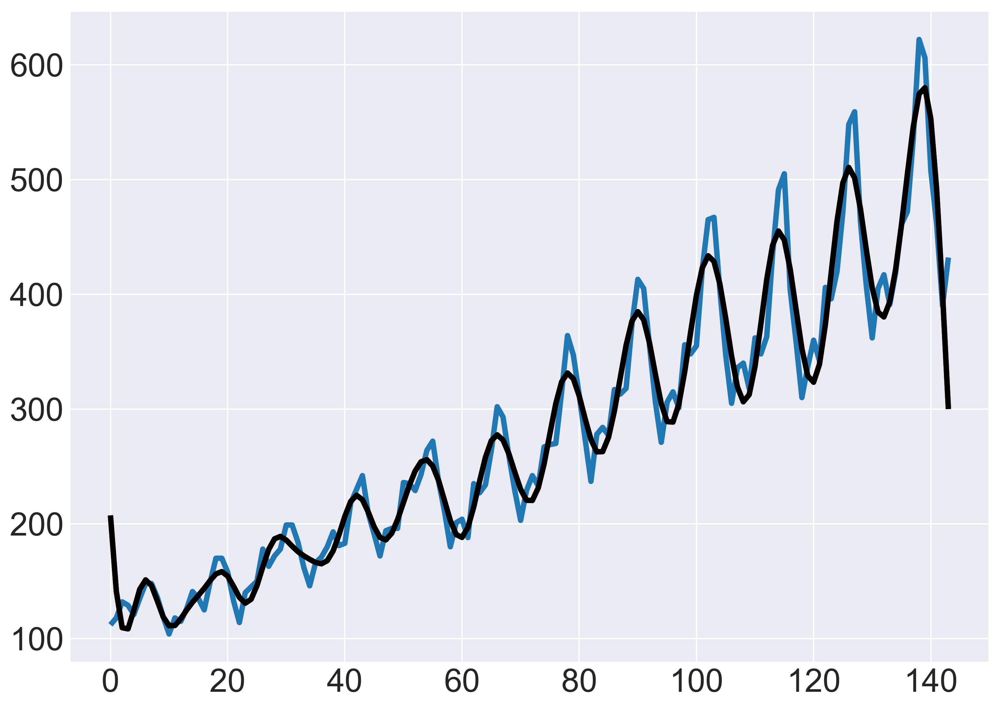

In [115]:
#потому что ряды фурье не умеют описывать трендовую компоненту
plt.plot(airline.values)
plt.plot(fourierExtrapolation(airline.values,0,20,1),c='red')
plt.plot(fourierExtrapolation(airline.values,0,20,1/12),c='black')

Для преобразования вр в частотный спектр обязательно в первую очередь нужно провести операцию детрендирования!

Давайте это сделаем

In [116]:
from sktime.transformations.series.boxcox import BoxCoxTransformer
def BC_inverse(y, lam, sig):
    """Back transform Box-Cox with Bias correction.
    See https://robjhyndman.com/hyndsight/backtransforming
    """
    if lam == 0:
        return np.exp(y) * (1 + 0.5 * sig**2)
    else:
        res = np.power(lam*y + 1., 1/lam)
        res *= (1 + 0.5 * sig**2 * (1 - lam) / (lam*y + 1.)**2)
        return res

In [117]:
from sktime.transformations.series.detrend import Detrender
from sktime.forecasting.trend import PolynomialTrendForecaster

In [118]:
# также помимо операции детрендирования обеспечим одинаковую амплитуду для сезонных колебаний
transformer = BoxCoxTransformer(method = "guerrero",sp=12)
airline_box = transformer.fit_transform(airline)

In [119]:
# выделяем из ряда полиномный тренд
airline_detrend = Detrender(PolynomialTrendForecaster(degree=2)).fit_transform(airline_box)

<Axes: xlabel='Month'>

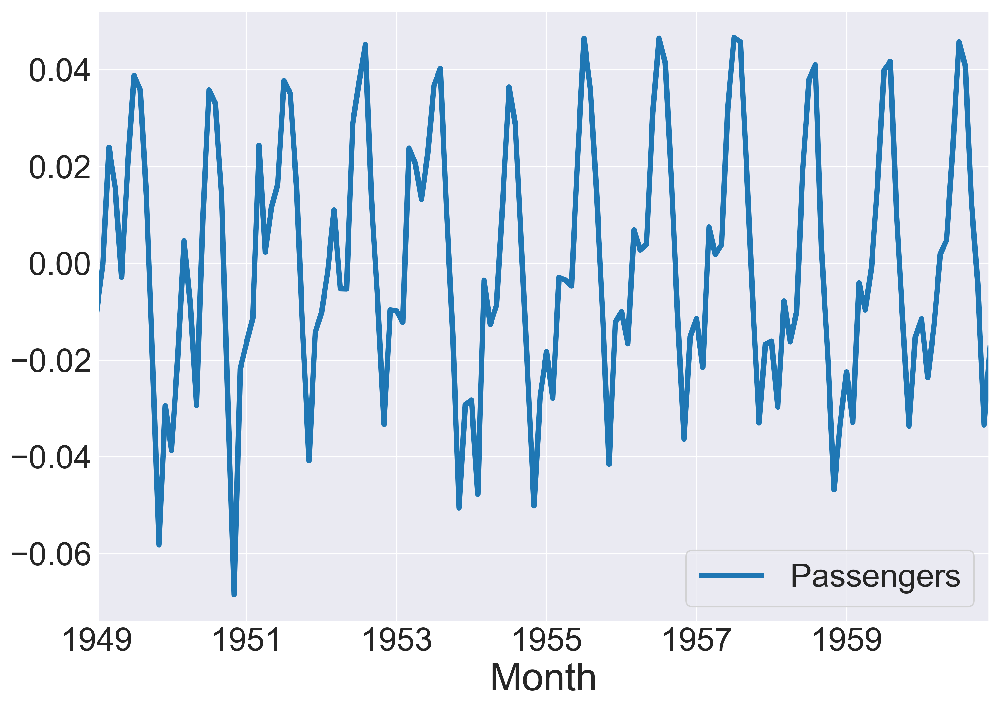

In [120]:
airline_detrend.plot()

In [121]:
# прямое преобразование фурье
fft_values = fft.fft(airline_detrend,axis=0)
N = len(airline)
freq_values = fft.fftfreq(N, 1/12)

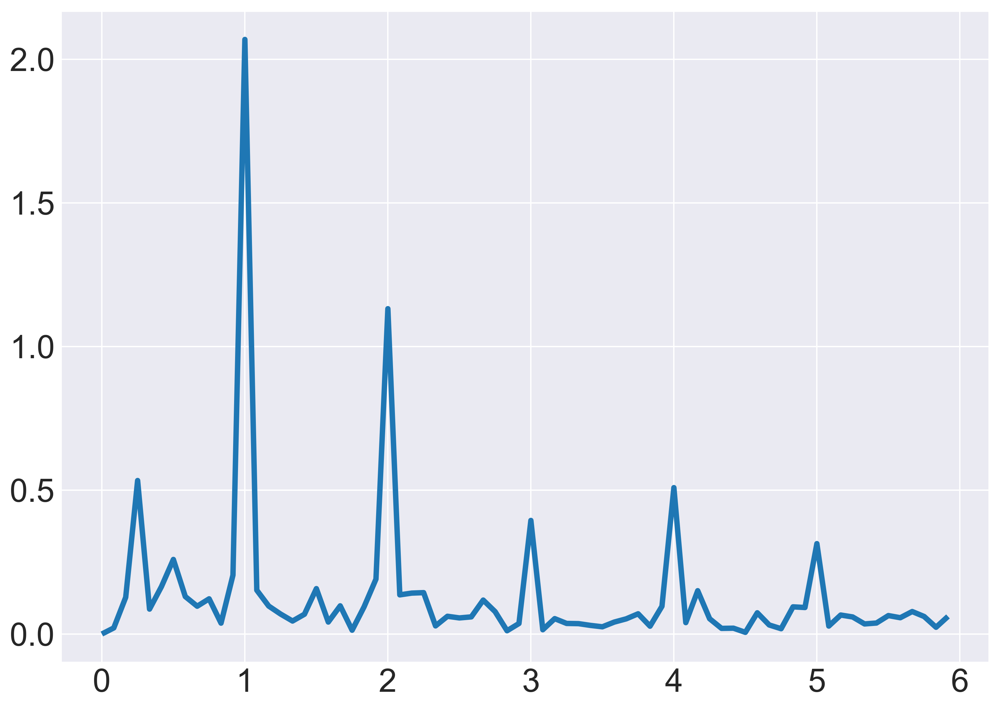

In [122]:
# теперь основные пики на периодограмме связаны с сезонностью
fig, ax = plt.subplots(1)
ax.plot(freq_values[:N//2], np.abs(fft_values[:N//2]));

In [123]:
# фильтр низких частот + преобразование Фурье
filtered = fft_values.copy()
filtered[np.abs(freq_values) > 4.5] = 0
signal_filtered = np.real(fft.ifft(filtered,axis=0))

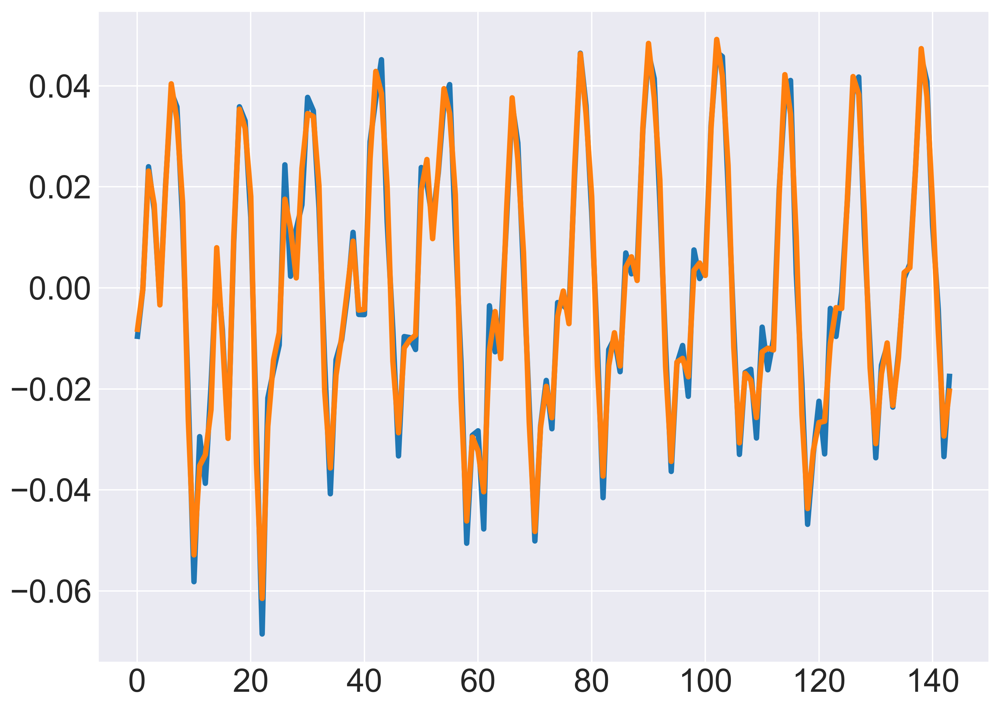

In [124]:
# достаточно точно восстановили исходный ряд
plt.plot(airline_detrend.values)
plt.plot(signal_filtered)

## Моделирование сезонной компоненты

Теперь попробуем с помощью рядов Фурье смоделировать сезонную компоненту

In [125]:
# Выделим в test последние 40 наблюдений
test_idx = 40

In [126]:
# попробуем тем же методом посчитать сезонность
ses_extra = fourierExtrapolation(airline_detrend.iloc[:-test_idx],test_idx,25)

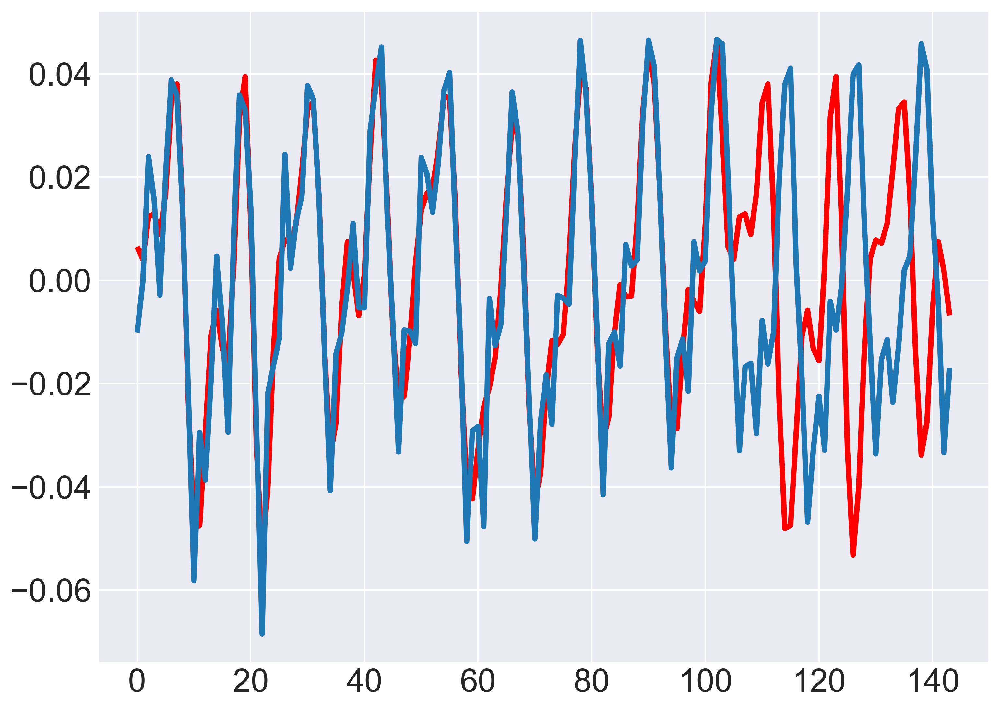

In [127]:
# на графике с фактической и прогнозной сезонностью видим, что предсказанная сезонность начинает
# смещаться относительно фактической
plt.plot(ses_extra,c='red')
plt.plot(airline_detrend.values)

Этот эффект называется "растекание частоты" (frequency leakage). Его причина - длина ряда не кратна частоте сезонной компоненты

In [128]:
# последнее наблюдение заканчивается на 8 месяце, а не на 12
airline_detrend.iloc[:-test_idx].tail()

,Passengers
Month,
1957-04-01,0.001847
1957-05-01,0.003823
1957-06-01,0.032087
1957-07-01,0.046659
1957-08-01,0.045790


In [129]:
# оценим самый значимые по амплитуде частоты
x_freqdom = fft.fft(airline_detrend.iloc[:-test_idx],axis=0)
n = len(airline_detrend.iloc[:-test_idx])
fourier = pd.DataFrame(x_freqdom)
fourier['freq'] = fft.fftfreq(n,1/12) 
fourier['amp'] = np.absolute(x_freqdom) / n
fourier['phase'] = np.angle(x_freqdom)

In [130]:
# видно, что эти частоты близки к значениям, кратным 1/12, но не равны ей
fourier.sort_values(by='amp',ascending=False)

,0,freq,amp,phase
9,-0.766744+0.847216j,1.038462,0.010987,2.306376
95,-0.766744-0.847216j,-1.038462,0.010987,-2.306376
96,0.573020+0.450659j,-0.923077,0.007010,0.666432
8,0.573020-0.450659j,0.923077,0.007010,-0.666432
87,0.580520-0.058797j,-1.961538,0.005610,-0.100939
...,...,...,...,...
67,0.022272+0.009055j,-4.269231,0.000231,0.386129
39,-0.020811+0.008985j,4.500000,0.000218,2.734018
65,-0.020811-0.008985j,-4.500000,0.000218,-2.734018
63,-0.005492-0.014999j,-4.730769,0.000154,-1.921812


давайте попробуем оценить сезонность с целым периодом

In [131]:
# Выделим в test последние 36 наблюдений
test_idx_full = 36

In [136]:
# обучающая выборка заканчивается в декабре
airline_detrend.iloc[:-test_idx_full].tail()

,Passengers
Month,
1957-08-01,0.045790
1957-09-01,0.020041
1957-10-01,-0.007978
1957-11-01,-0.032958
1957-12-01,-0.016740


In [138]:
# оценим самый значимые по амплитуде частоты
x_freqdom = fft.fft(airline_detrend.iloc[:-test_idx_full],axis=0)
n = len(airline_detrend.iloc[:-test_idx_full])
fourier = pd.DataFrame(x_freqdom)
fourier['freq'] = fft.fftfreq(n,1/12) 
fourier['amp'] = np.absolute(x_freqdom) / n
fourier['phase'] = np.angle(x_freqdom)

In [139]:
# здесь частоты кратны 1/12
fourier.sort_values(by='amp',ascending=False)

,0,freq,amp,phase
9,-1.480701-0.409829j,1.000000,0.014226,-2.871572
99,-1.480701+0.409829j,-1.000000,0.014226,2.871572
90,0.545992+0.702154j,-2.000000,0.008236,0.909866
18,0.545992-0.702154j,2.000000,0.008236,-0.909866
36,0.085397+0.420513j,4.000000,0.003973,1.370442
...,...,...,...,...
16,-0.011646+0.000848j,1.777778,0.000108,3.068872
87,-0.003934-0.010783j,-2.333333,0.000106,-1.920591
21,-0.003934+0.010783j,2.333333,0.000106,1.920591
68,0.002426+0.001134j,-4.444444,0.000025,0.437285


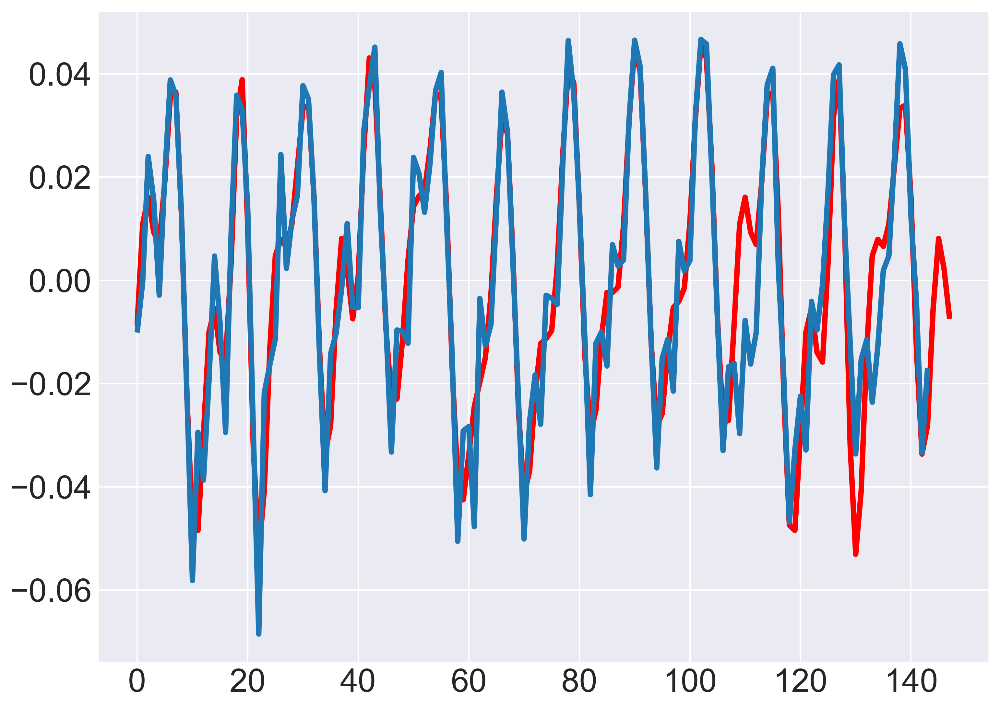

In [135]:
# на графике с фактической и прогнозной сезонностью видим, что смещение между линиями пропало
plt.plot(fourierExtrapolation(airline_detrend.iloc[:-test_idx_full],40,25),c='red')
plt.plot(airline_detrend.values)

Ряды Фурье применяется для прогнозирования рядом с длинными сезонностями, например, для моделирования годовой сезонности в подневных данных, чтобы не вводить 365 бинарных переменных. Для более коротких сезонностей можно использовать бинарные переменные. При моделировании сезонности с помощью рядов Фурье стоит всегда помнить про необходимость детрендировать ряд, а также про эффект "растекания частоты".

# Прогнозирование стационарных вр

В этом разделе потренируемся подбирать оптимальные гиперпараметры для моделей ARMA.

## Искусственный ряд ARMA

In [140]:
arma33_model = sm.tsa.ArmaProcess(ar=[1,0.5,0.55,0.2],ma=[1, -0.4, 0.3, -0.9],nobs=10000)
arma33_ts = pd.Series(arma33_model.generate_sample(500,burnin=10000))

<Axes: >

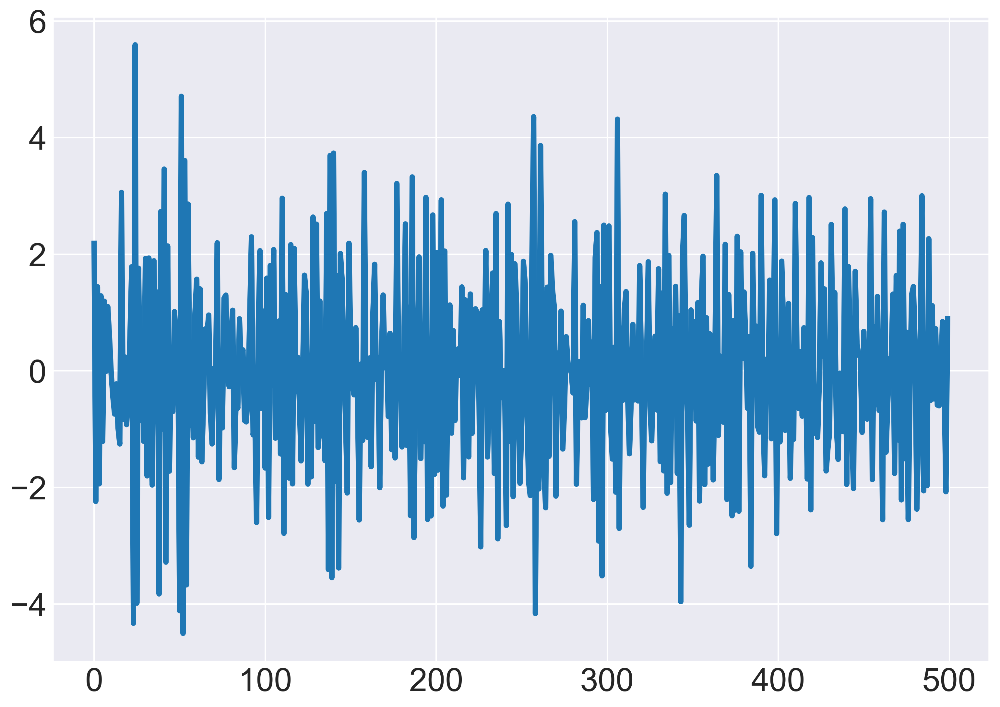

In [141]:
arma33_ts.plot()

In [144]:
# проверяем, что ряд стационарный
adfuller(arma33_ts)[1]

4.403798526055995e-14

In [145]:
# отложим последние 50 точек в тестовую выборку
train_idx = 450

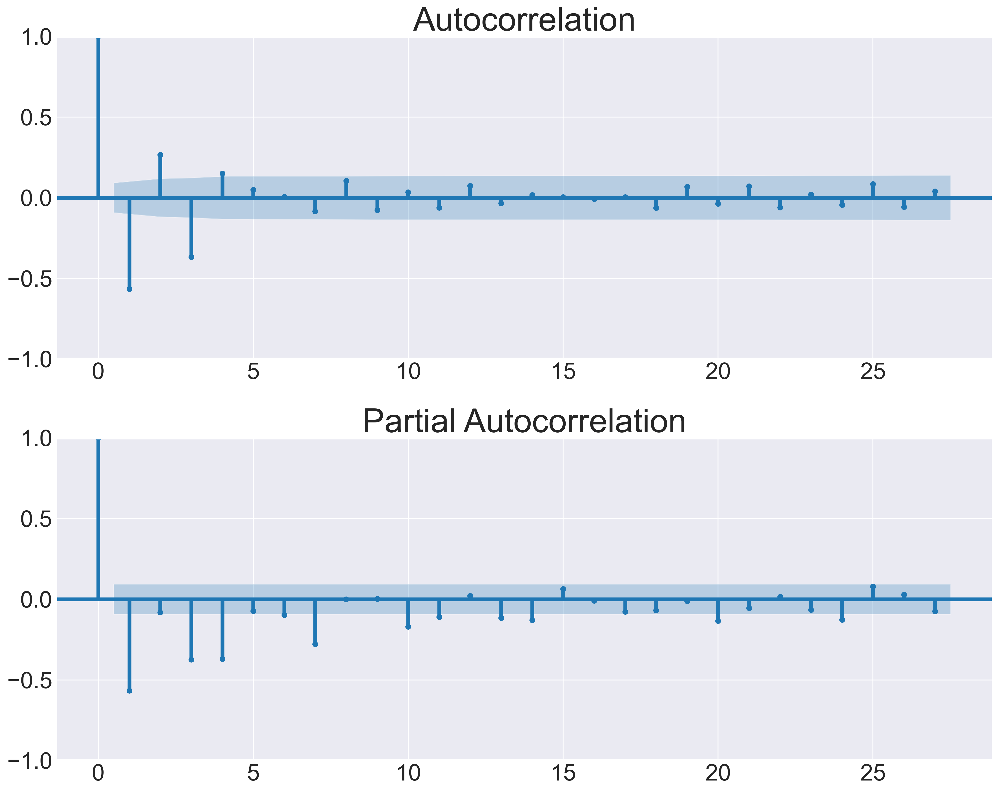

In [146]:
# подберем максимальные значения для p и q
# здесь правильно подбираем гиперпараметры
fig,ax =plt.subplots(2,1,figsize= (15,12)) 
tsaplots.plot_acf(arma33_ts.iloc[:train_idx],ax=ax[0]);
tsaplots.plot_pacf(arma33_ts.iloc[:train_idx],ax=ax[1]);

In [147]:
# на ЧАКФ 4 первых лага статзначимо отличны от нуля - соответственно, максимальный порядок ar части p - 4
# на АКФ 3 первых лага + 5й статзначимо отличны от нуля - возьмем максимальный порядок ma части q с запасом - 5
params, arima = calc_optimum_arma(arma33_ts,3,5)

24


In [148]:
arima.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  500
Model:               SARIMAX(3, 0, 3)   Log Likelihood                -728.448
Date:                Fri, 06 Dec 2024   AIC                           1472.896
Time:                        04:48:58   BIC                           1506.613
Sample:                             0   HQIC                          1486.127
                                - 500                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -0.0004      0.001     -0.381      0.703      -0.002       0.002
ar.L1         -0.5089      0.049    -10.293      0.000      -0.606      -0.412
ar.L2         -0.6033      0.050    -12.173      0.000      -0.700      -0.506
ar.L3         -0.2313      0.051     -4.491      0.000      -0.332      -0.130
ma.L1         -0.3951      0.026    -14.971      0.000      -0.447      -0.343
ma.L2          0.3287      0.026     12.681      0.000       0.278       0.380
ma.L3         -0.9210      0.027    -33.615      0.000      -0.975      -0.867
sigma2         1.0557      0.070     15.003      0.000       0.918       1.194
===================================================================================
Ljung-Box (L1) (Q):                   0.05   Jarque-Bera (JB):                 0.00
Prob(Q):                              0.82   Prob(JB):                         1.00
Heteroskedasticity (H):               0.89   Skew:                             0.00
Prob(H) (two-sided):                  0.46   Kurtosis:                         3.00
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

Теперь потренеруемся оценивать качество моделей на кросс-валидации с помощью библиотеки sktime. 

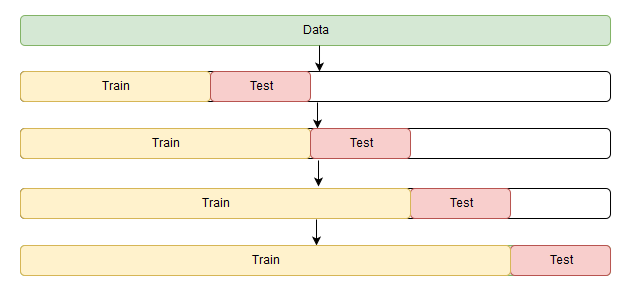

In [149]:
# Попробуем оценить качество прогнозов на 1 и 3 шага вперед с помощью расширяющегося скользящего окна (см. рис выше)
splitter1 = ExpandingWindowSplitter(fh=1,initial_window=train_idx,step_length=1)
splitter3 = ExpandingWindowSplitter(fh=3,initial_window=train_idx,step_length=1)

In [151]:
forecaster = ARIMA((0,0,4))

In [152]:
# воспользуемся функцией evaluate, чтобы получить предикты на кросс-валидации
# 2 прогноза на 50 точек с переобучением нбегут полторы минуты!
df1 = evaluate(forecaster=forecaster, 
              y=arma33_ts, 
              cv=splitter1, 
              strategy="refit", 
              return_data=True)

df3 = evaluate(forecaster=forecaster, 
              y=arma33_ts, 
              cv=splitter3, 
              strategy="refit", 
              return_data=True)

In [158]:
df1.head()

,test_MeanAbsolutePercentageError,fit_time,pred_time,len_train_window,cutoff,y_train,y_test,y_pred,resid
0,0.473164,1.234681,0.019340,450,449,0 2.234402 1 -2.238449 2 1.44150...,0.676858,0.997123,-0.320265
1,0.505476,0.543516,0.006039,451,450,0 2.234402 1 -2.238449 2 1.44150...,-0.397450,-0.598351,0.200901
2,0.399187,0.357658,0.005773,452,451,0 2.234402 1 -2.238449 2 1.44150...,-0.827028,-0.496889,-0.330139
3,2.722425,0.463933,0.005620,453,452,0 2.234402 1 -2.238449 2 1.44150...,-0.570482,0.982612,-1.553094
4,0.646142,0.414154,0.005821,454,453,0 2.234402 1 -2.238449 2 1.44150...,2.950105,1.043917,1.906188


In [165]:
df3.head(10)

,test_MeanAbsolutePercentageError,fit_time,pred_time,len_train_window,cutoff,y_train,y_test,y_pred,resid
0,0.796579,0.419280,0.006126,450,449,0 2.234402 1 -2.238449 2 1.44150...,-0.827028,-0.168235,-0.658793
1,1.983238,0.363492,0.005703,451,450,0 2.234402 1 -2.238449 2 1.44150...,-0.570482,0.560919,-1.131401
2,1.107619,0.433478,0.005442,452,451,0 2.234402 1 -2.238449 2 1.44150...,2.950105,-0.317489,3.267593
3,1.207732,0.291969,0.005566,453,452,0 2.234402 1 -2.238449 2 1.44150...,-1.864541,0.387325,-2.251866
4,0.452371,0.290650,0.005487,454,453,0 2.234402 1 -2.238449 2 1.44150...,0.753861,1.094886,-0.341025
5,2.949840,0.368524,0.005860,455,454,0 2.234402 1 -2.238449 2 1.44150...,-0.583013,-2.302809,1.719796
6,0.347468,0.422194,0.005448,456,455,0 2.234402 1 -2.238449 2 1.44150...,1.276132,0.832716,0.443416
7,2.155131,0.339267,0.005476,457,456,0 2.234402 1 -2.238449 2 1.44150...,-0.679653,0.785089,-1.464742
8,4.442966,0.346887,0.005989,458,457,0 2.234402 1 -2.238449 2 1.44150...,0.324793,-1.118252,1.443045
9,0.682538,0.324960,0.005278,459,458,0 2.234402 1 -2.238449 2 1.44150...,-2.552156,-0.810212,-1.741944


In [155]:
# как видно из содержания df1 и df3 выше, в колонках  y_train,y_test,y_pred лежат pd.Series, 
# для удобства приводим их к обычным числам
df1['y_pred'] = df1['y_pred'].apply(lambda x: x.values[0]) 
df1['y_test'] = df1['y_test'].apply(lambda x: x.values[0]) 

df3['y_pred'] = df3['y_pred'].apply(lambda x: x.values[0]) 
df3['y_test'] = df3['y_test'].apply(lambda x: x.values[0]) 

df1['resid'] = df1['y_test'] - df1['y_pred']
df3['resid'] = df3['y_test'] - df3['y_pred']

<Axes: >

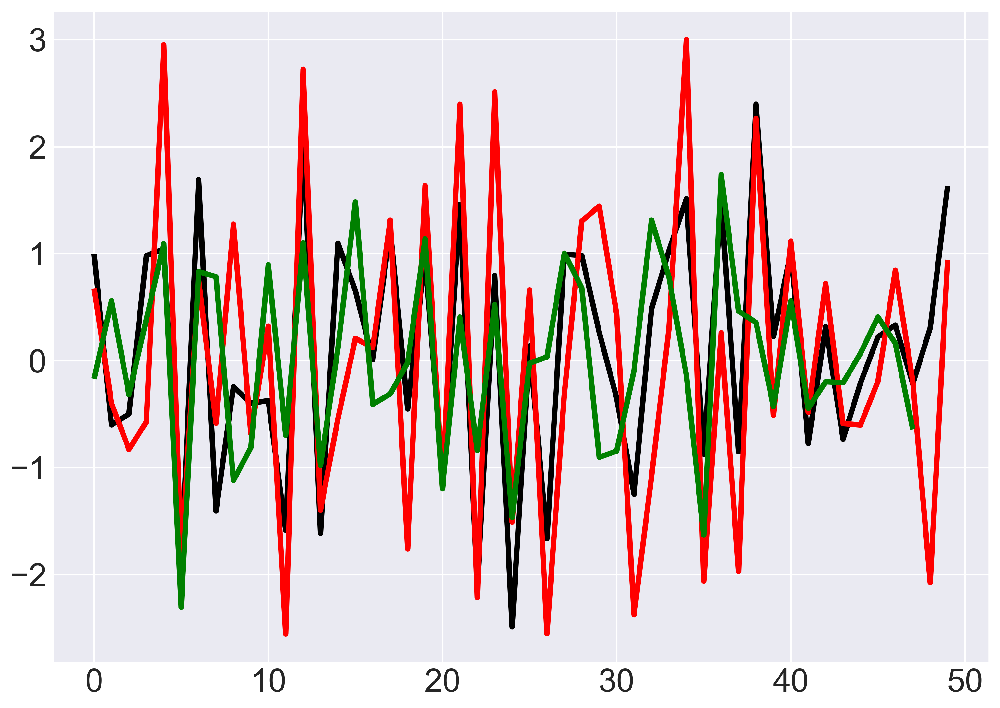

In [156]:
# начертим на одном графике прогнозы и факты
df1['y_pred'].plot(c='black')
df1['y_test'].plot(c='red')
df3['y_pred'].plot(c='green')

визуально качество прогнозов оценить сложно, оценим качество остатков и метрики прогнозов

In [159]:
# при прогнозе на 1 шаг вперед остатки обладают всеми необходимыми свойствами
check_fit(df1['resid'])

{'mean_resids': -0.1105027396940894,
 'mean_t': -0.8209295156907862,
 'mean_pval': 0.4156625701685741,
 'stationary_t': -6.496813015464333,
 'stationary_pval': 0.999999988113413,
 'autocor_pval': True,
 'norm_t': 0.9899525206216985,
 'norm_pval': 0.9450619440984133,
 'heteroscedasticity_t': 0.004761489597641055,
 'heteroscedasticity_pval': 0.9452734600900596,
 'check_result': True}

In [160]:
# при прогнозе на 3 шага вперед появляются остаточные корреляции
check_fit(df3['resid'])

{'mean_resids': -0.03919771285004859,
 'mean_t': -0.21147259031847254,
 'mean_pval': 0.8334328447522943,
 'stationary_t': -7.687688087539286,
 'stationary_pval': 0.9999999999855311,
 'autocor_pval': False,
 'norm_t': 0.9895294204811018,
 'norm_pval': 0.942417420861437,
 'heteroscedasticity_t': 3.2554518054881627,
 'heteroscedasticity_pval': 0.07773600433311187,
 'check_result': False}

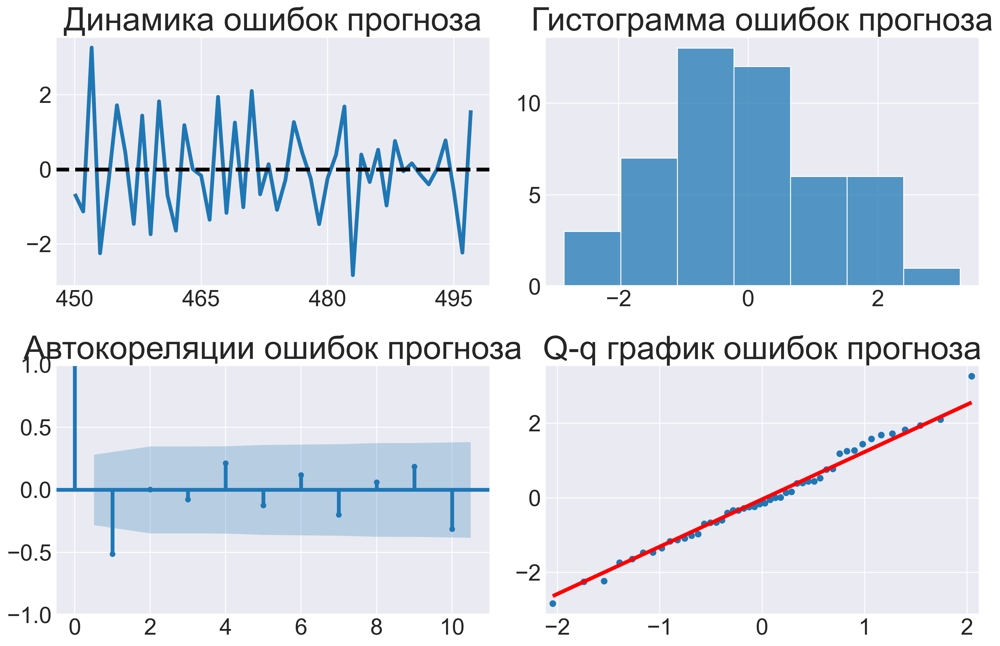

In [161]:
plot_diagnostics(df3,'len_train_window','resid')

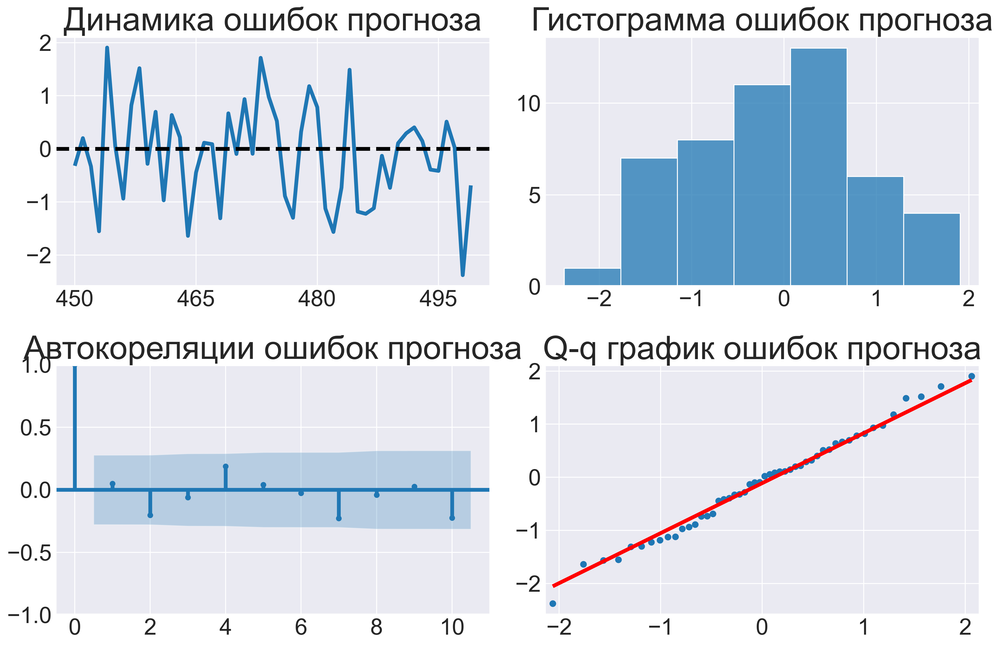

In [162]:
plot_diagnostics(df1,'len_train_window','resid')

теперь сравним метрики качества прогноза

In [163]:
metrics_report(df1['y_test'].values, df1['y_pred'].values)

,mean,median,quan_75,quan_95,std
maes,0.763641,0.692714,1.165819,1.680081,0.568649
maes_zero,1.223983,1.013616,1.925714,2.647411,0.850700
mapes,96.950699,60.581639,123.035296,289.262810,102.854613
mapes_zero,100.036959,99.347666,101.441819,105.985809,3.732557
r2,0.592252,0.592252,0.592252,0.592252,0.592252


In [164]:
metrics_report(df3['y_test'].values, df3['y_pred'].values)

,mean,median,quan_75,quan_95,std
maes,1.011353,0.873469,1.498446,2.246080,0.778524
maes_zero,1.252330,1.100779,1.967180,2.671512,0.856263
mapes,107.301190,68.116710,122.986918,309.896363,113.835391
mapes_zero,100.103672,99.092275,101.878334,108.436596,5.210083
r2,0.293028,0.293028,0.293028,0.293028,0.293028


Метрики при прогнозе на 1 шаг вперед ожидаемо лучше. Ухудшение связано с отсутствием информации о первом и втором лагах для модели МА. Тем не менее, даже такие прогнозы значительно лучше среднего по вр